## Chinese Blackjack Game (Ban Luck) - Lim Wee Kiat (Pydot24)

Chinese Blackjack are played mostly in SEA, and is slightly different from the conventional Blackjack. This project will cover:
- Casino-like betting system
- Dealer bot that plays with you with pre-fixed policy
- More visuals and interactive compared to OpenAI Blackjack gym
- With natural win rules like Ban-luck (Ace & 10), Ban Ban (Ace & Ace), Triple-7, and dragon (5 cards with <=21pts in total) with its multiplyer reward
- Game state data will be collected during the game, so at the end of the game, player can review the game summary and see trends
- Reinforcement learning application to boost winning's odd

![Banluck](https://cdn-blog.seedly.sg/wp-content/uploads/2018/02/30021113/banluck-cards-special-combination-2-01.png)

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import random
from termcolor import colored
import seaborn as sns
sns.set(style = 'darkgrid')
from collections import Counter
%matplotlib inline

### Creating in-game Functions

In [39]:
def draw_hand(actual_deck):
    """
    This code will draw 2 cards randomly from the deck specified, and remove the cards drew from the deck.
    This function will return a list of 2 cards i.e. ['K',8]
    """
    
    hand = []
    for i in range(2):
        rand_ = random.randint(0,len(actual_deck)-1)
        hand.append(actual_deck[rand_])
        actual_deck.pop(rand_)
    return hand


In [40]:
def draw_card(actual_deck, hand):
    """
    This function will draw one card randomly from the deck. Use when "HIT" action is activated. It will also remove the card drew from the deck.
    This function will take input of card deck and the existing hand, and return new list of cards.
    """
    rand_ = random.randint(0,len(actual_deck)-1)
    hand.append(actual_deck[rand_])
    actual_deck.pop(rand_)
    return hand

In [41]:
def calculate_pts(card_lst):
    """
    This function calculates the total number of points, based on the cards on hand. It will take into consideration on usable Ace.
    This will return you a list of points. 
    If there is usable ace, it will return you list of 2 points (min and max) i.e. [10,20].
    If there is no usable ace, it will return you list of 1 point i.e. [15]
    """
       
    pts = 0
    pts_lst = []
    for card in card_lst:
        if str(card) in "JQK":
            pts += 10
        elif type(card) == int:
            pts += card
        elif str(card) == "A":
            pts += 1
    pts_lst.append(pts) #min_point
    
    #explore max points that is within 21. Exceeding 21 will not be considered.
    count = card_lst.count("A")
    if len(card_lst) >= 4:
        pass
    else:
        for i in range(count):
            pts = pts + (i+1)*10
            if pts > 21:
                pass
            else:
                pts_lst.append(pts)
    return pts_lst


In [42]:
def compare(player_pts, dealer_pts):
    """
    This function compares between player point and dealer point and return the result.
    For result, 0 is draw; 1 is player win; -1 is player lost.
    """
    # 0 - draw / 1 - player win / -1 - player lost
    if (21-dealer_pts <0 and 21-player_pts <0) or dealer_pts == player_pts:
        return 0
    elif (21-dealer_pts >= 0 and 21-player_pts <0): #dealer positive and player negative: player lost
        return -1
    elif (21-dealer_pts < 0 and 21-player_pts >= 0): #dealer negative and player positive: player won
        return 1
    else:
        return (player_pts > dealer_pts) - (player_pts < dealer_pts) 

In [43]:
def display_pts(play_pts):
    """
    This function will display the points based on the card on hand.
    """
    if len(play_pts)>1:
        print(f"You have total of {play_pts[0]} or {play_pts[1]}.")
    else: 
        print(f"You have total of {play_pts[0]}.")

### Reinforced Learning Parameters

In [44]:
class Blackjack():

    # for reinforced learning - Q value storage
    def __init__(self, lr=0.1, exp_rate=0.3):
        self.player_Q_Values = {}  # key: [(player_value, show_card)][action] = value
        # initialise Q values | (15-21) x (1-10) x (1, 0)
        for i in range(11, 22):
            for j in range(1, 11):
                for k in [True,False]:
                    self.player_Q_Values[(i, j, k)] = {}
                    for a in [1, 0]:
                        if (i == 21) and (a == 0):
                            self.player_Q_Values[(i, j, k)][a] = 1
                        else:
                            self.player_Q_Values[(i, j, k)][a] = 0

        self.full_deck = []
        self.player_state_action = []
        self.state = (0, 0, False)  # initial state
        self.actions = [1, 0]  # 1: HIT  0: STAND
        self.last_action = 0
        self.end_turn = False
        self.player_multi = 0
        self.player_natwin = False
        self.dealer_multi = 0
        self.dealer_natwin = False
        self.end_game = False
        self.lr = lr
        self.exp_rate = exp_rate
    
    # reset all game state to default. Need to trigger on every new game
    def reset(self):
        self.player_state_action = []
        self.state = (0, 0, False) # initial state
        self.last_action = 0
        self.end_turn = False
        self.player_multi = 0
        self.player_natwin = False
        self.dealer_multi = 0
        self.dealer_natwin = False
        self.end_game = False
    
    # construct a deck
    def build_deck(self):
        picture = "AJQK"
        
        for i in range(0,4):
            for j in range(0,9):
                self.full_deck.append(j+2)
            
            for k in picture:
                self.full_deck.append(k)
        random.shuffle(self.full_deck)
    
    
    # determine if there is a natural win for player, either during start of the game or during card drawing
    def natural_win_player(self, player_deck):
        banluck = [['A',i] for i in ['J','Q','K',10]]
        banluck.extend([[i, 'A'] for i in ['J','Q','K',10]])
        triple_7 = [7,7,7]
        for i in banluck:
            if i == player_deck:
                print("You got Ban Luck!")
                self.player_multi = 2
                self.player_natwin = True
                self.end_game = True
        if player_deck == ['A','A']:
            print("You got Ban Ban!")
            self.player_multi = 3
            self.player_natwin = True
            self.end_game = True
        elif player_deck == triple_7:
            print("You got Triple 7!")
            self.player_multi = 7
            self.player_natwin = True
            self.end_game = True
        elif len(player_deck)==5 and min(calculate_pts(player_deck)) <= 21:
            print("You got Dragon!")
            self.player_multi = 2
            self.player_natwin = True
            self.end_game = True
    
    # determine if there is a natural win for dealer, either during start of the game or during card drawing
    def natural_win_dealer(self, dealer_deck):
        banluck = [['A',i] for i in ['J','Q','K',10]]
        banluck.extend([[i, 'A'] for i in ['J','Q','K',10]])
        triple_7 = [7,7,7]
        for i in banluck:
            if i == dealer_deck:
                print("Dealer got Ban Luck!")
                self.dealer_multi = 2
                self.dealer_natwin = True
                self.end_game = True
        if dealer_deck == ['A','A']:
            print("Dealer got Ban Ban!")
            self.dealer_multi = 3
            self.dealer_natwin = True
            self.end_game = True
        elif dealer_deck == triple_7:
            print("Dealer got Triple 7!")
            self.dealer_multi = 7
            self.dealer_natwin = True
            self.end_game = True
        elif len(dealer_deck)==5 and min(calculate_pts(dealer_deck)) <= 21:
            print("Dealer got Dragon!")
            self.dealer_multi = 2
            self.dealer_natwin = True
            self.end_game = True 
    
    # To use with natural_win_player/dealer function.
    # To cover the case when there are 2 natural winning cases occur.
    # This function will compare who is the winner from both natural wins.
    def natural_winner(self, bid):
        if self.player_multi > self.dealer_multi:
            payout = bid*(self.player_multi - self.dealer_multi)
            print(f"YOU WON! ${payout} to your stash.")
        elif self.player_multi < self.dealer_multi:
            payout = bid*(self.player_multi - self.dealer_multi)
            print(f"YOU LOST! ${payout} to your stash.")
        elif self.player_natwin and self.dealer_natwin:
            payout = 0
            print("IT IS A DRAW!")
        return payout
    
    # This function will print text based on the winning result and bid price
    def winner(self, result, bid):
        if result == 1:
            print(f"YOU WON! ${bid} to your stash.")
            return bid
        elif result == -1:
            print(f"YOU LOST! ${-bid} to your stash.")
            return -bid
        else:
            print("IT IS A DRAW!")
            return 0
        
    # This function is for reinforcement learning. Model will use this to choose action between HIT or STAND.
    # 1 is HIT and 0 is STAND
    # To let model choose completely random action, set exp_rate to 1, else 0 (or x to random for x% of the time)
    def chooseAction(self):
        # if current value <= 11, always hit
        current_value = self.state[0]
        if current_value <= 15:
            return 1

        if np.random.uniform(0, 1) <= self.exp_rate:
            action = np.random.choice(self.actions)
            print("random action", action)
        else:
            # greedy action
            v = -999
            action = 0
            for a in self.player_Q_Values[self.state]:
                if self.player_Q_Values[self.state][a] > v:
                    action = a
                    v = self.player_Q_Values[self.state][a]
                    print("greedy action", action)
        return action
    
    def _giveCredit(self, player_pts, dealer_pts):
        reward = compare(player_pts, dealer_pts)
        # backpropagate reward
        for s in reversed(self.player_state_action):
            state, action = s[0], s[1]
            reward = self.player_Q_Values[state][action] + self.lr*(reward - self.player_Q_Values[state][action]) #+ 0.1*((reward-1)/2*reward*self.lr*abs(21-player_pts)) #changed
            self.player_Q_Values[state][action] = round(reward, 3)

### Actual Game Environment

In [45]:
vers = 2.00
player = Blackjack()
player.build_deck()
actual_deck = player.full_deck.copy()
player.reset()

# for Data collection
total_chips = [50000] #starting
bid_lst = [0]
LnP = [0]
player_pts_lst = [0]
deal_pts_lst = [0]

print(f"$$$ You have starting cash of ${total_chips[-1]}")

for i in range(0,1000):
    player.reset()
    # DECK SHUFFLE - only shuffle when 70% of card is consumed
    if len(actual_deck)/52 <= 0.3:
        random.shuffle(full_deck)
        actual_deck = full_deck.copy()    
    else: random.shuffle(actual_deck)
    
    # Bidding input verification
    bid = input("How much do you want to bid? : ")
    while sum([ 1 for j in bid if j not in "0123456789"])>0:
        print("Please enter valid integer.")
        bid = input("How much do you want to bid? : ")
        continue
    bid = eval(bid)
    while bid > total_chips[-1]:
        print("You have no money...")
        bid = input("How much do you want to bid? : ")
        bid = eval(bid)
        continue
    bid_lst.append(bid)
    
    print("\n")
    print(f"************************** Round {i+1} **************************")
    print(f"$$$ You have bidded ${bid}!")
    print(f"$$$ You have remaining ${total_chips[-1] - bid_lst[-1]}!")
    print("\n")
    print(colored("--- Player's Turn ---", 'blue'))
    player_hand = draw_hand(actual_deck)
    dealer_hand = draw_hand(actual_deck)
    play_pts = calculate_pts(player_hand)
    deal_pts = calculate_pts(dealer_hand)
    print(f"You got: {player_hand}")
    
    # Check for Natural Win
    player.natural_win_player(player_deck = player_hand)
    player.natural_win_dealer(dealer_deck = dealer_hand)
    if player.end_game == True:
        pay = player.natural_winner(bid)
        total_chips.append(total_chips[-1]+pay)
        LnP.append(pay)
        player_pts_lst.append(min(play_pts)) # data collection
        deal_pts_lst.append(min(play_pts)) # data collection
        continue
    
    # Continue if no Natural Win
    # ------------------------------- PLAYER TURN ----------------------------------
    play_pts = calculate_pts(player_hand)
    display_pts(play_pts)
    action = "h"
    
    while "h" in action and not player.end_turn:
        print("\n")
        print("* Do you want to HIT or STAND?")
        print(f"* Card deck remaining: {len(actual_deck)}")
        #action = 's'
        action = input("* Enter HIT/H or STAND/S : ").lower()
        print("\n")
        if max(play_pts) < 16 and "h" not in action:
            print("You have to draw a card as your point is lower than 16.")
            print("\n")
            action = "h"
            player_hand = draw_card(actual_deck, player_hand)
            print(f"You got: {player_hand}")
            player.natural_win_player(player_deck = player_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
            play_pts = calculate_pts(player_hand)
            display_pts(play_pts)
        elif min(play_pts)>21: 
            print("BUSTED. Dealer's turn.")
            print("\n")
            player.end_turn = True
            break
        elif "s" in action:
            player.end_turn = True
            break
        else:
            player_hand = draw_card(actual_deck, player_hand)
            print(f"You got: {player_hand}")
            player.natural_win_player(player_deck = player_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
            play_pts = calculate_pts(player_hand)
            display_pts(play_pts)
        
    # ------------------------------- DEALER TURN ----------------------------------
    if not player.end_game:
        print(colored("--- Dealer's Turn ---", 'red'))      
        while max(deal_pts) < 17 and len(dealer_hand)<5:
            dealer_hand = draw_card(actual_deck,dealer_hand)
            print("Dealer drew a card...")
            deal_pts = calculate_pts(dealer_hand)
            player.natural_win_dealer(dealer_deck = dealer_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
        
        play_pts = max(play_pts)
        deal_pts = max(deal_pts)
        print(f"Dealer got : {dealer_hand}")
        print(f"Dealer have total of {deal_pts}.")
        print("\n")
        result = compare(play_pts, deal_pts)
        pay = player.winner(result, bid)
        player.end_game = True
        print("\n")

    # ------------------------------- VERDICT ----------------------------------
        
    play_pts = max(calculate_pts(player_hand))
    deal_pts = max(calculate_pts(dealer_hand))
    LnP.append(pay)
    total_chips.append(total_chips[-1]+pay)
    player_pts_lst.append(play_pts) # data collection
    deal_pts_lst.append(deal_pts) # data collection
    cont_ = input("Continue to next round? Y/N :")
    #cont_ = "y"
    while cont_.lower() not in "yn":
        print("Invalid input. Please enter Y/N.")
        cont_ = input("Continue to next round? Y/N :")   
    if cont_.lower() == 'y':
        player.reset()
        continue
    elif cont_.lower() == 'n':
        print("Game ended.")
        # see result
        break

$$$ You have starting cash of $50000
How much do you want to bid? : 200


************************** Round 1 **************************
$$$ You have bidded $200!
$$$ You have remaining $49800!


--- Player's Turn ---
You got: [7, 6]
You have total of 13.


* Do you want to HIT or STAND?
* Card deck remaining: 48
* Enter HIT/H or STAND/S : h


You got: [7, 6, 8]
You have total of 21.


* Do you want to HIT or STAND?
* Card deck remaining: 47
* Enter HIT/H or STAND/S : s


--- Dealer's Turn ---
Dealer got : [9, 8]
Dealer have total of 17.


YOU WON! $200 to your stash.


Continue to next round? Y/N :n
Game ended.


### Game Summary Review

In [46]:
def game_summary(total_chips = total_chips, LnP = LnP, bid_lst = bid_lst,player_pts_lst=player_pts_lst):
    df = pd.DataFrame(columns=["Total_Chips",'Profit&Loss'])
    df['Total_Chips'] = total_chips
    df['Profit&Loss'] = LnP
    df['Bid_input'] = bid_lst
    df['Player_Points_Final'] = player_pts_lst
    df['Dealer_Points_Final'] = deal_pts_lst
    df['Result'] = df['Profit&Loss'].apply(lambda x : "Win" if x > 0 else ( "Lose" if x <0 else "Draw" ))
    df['Natural_win'] = abs(df['Profit&Loss']) / df['Bid_input']>1
    
    nat_win = df[df['Natural_win']==True]['Natural_win'].count()
    overall = (len(df)-1) 
    no_of_lose = df[df['Result']=="Lose"]['Result'].count()
    no_of_win = df[df['Result']=="Win"]['Result'].count()
    no_of_draw = df[df['Result']=="Draw"]['Result'].count() -1
    initial_chp = df['Total_Chips'][0]
    final_chp = df['Total_Chips'][len(df)-1]
    earning = df['Profit&Loss'].sum()


    print("   ======================= GAME SUMMARY =======================")
    print('\n')
    print(f'   Number of games       : {overall}        Winning Probability: {(no_of_win *100 / overall):.2f} %')
    print(f'   Number of games WON   : {no_of_win}         Initial Chips      : $ {initial_chp}')
    print(f'   Number of games LOST  : {no_of_lose}         Final Chips        : $ {final_chp}')
    print(f'   Number of games DRAW  : {no_of_draw}         Total Earning/Loss : $ {earning}')
    print(f'   Number of Natural WIN : {nat_win}')
    
    ## Plot Graph
    
    fig, ax = plt.subplots(2,1,figsize = (16,8))
    sns.set()
    a = ax.flatten()

    y1 = df['Total_Chips']
    y2= df['Profit&Loss']
    x2 = list(df.index)
    
    if len(x2)>100:
        x3 = []
    else: x3 = x2
    
    a[0].plot(y1)
    ax[0].set_xticks(x3)

    a[0].set_title("Game Summary: Trend of Cummulated Chips", loc='center')
    a[0].set_xlabel('Game Round')
    a[0].set_ylabel('$ Total Chips')

    my_color=np.where(y2>=0, 'orange', 'red')
    plt.vlines(x=x2, ymin=0, ymax=y2, color=my_color, alpha=0.4)
    plt.scatter(x2, y2, color=my_color, s=1, alpha=1)
    ax[1].set_xticks(x3)

    a[1].set_title("Game Summary: Profit/Loss Trend", loc='center')
    a[1].set_xlabel('Game Round')
    a[1].set_ylabel('$ Profit / Loss')
    
    
    fig2, ax2 = plt.subplots(figsize = (17,5))
    sns.distplot( df["Player_Points_Final"] , color="skyblue", label="Player's Points")
    sns.distplot( df["Dealer_Points_Final"] , color="red", label="Dealer's Points")
    ax2.set_title('Distribution Analysis on Final Card Points')
    ax2.set_ylabel("Points")
    ax2.set_xlabel("Frequency")
    
    fig3, ax3 = plt.subplots(figsize = (18,5))
    sns.heatmap(pd.crosstab(df['Player_Points_Final'],df['Dealer_Points_Final']), cmap = "Blues")
    
    fig.tight_layout()
    ax2.legend()
    plt.show()
    
    return df

   ======================= GAME SUMMARY =======================


   Number of games       : 1        Winning Probability: 100.00 %
   Number of games WON   : 1         Initial Chips      : $ 50000
   Number of games LOST  : 0         Final Chips        : $ 50200
   Number of games DRAW  : 0         Total Earning/Loss : $ 200
   Number of Natural WIN : 0


C:\Users\Wee Kiat\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


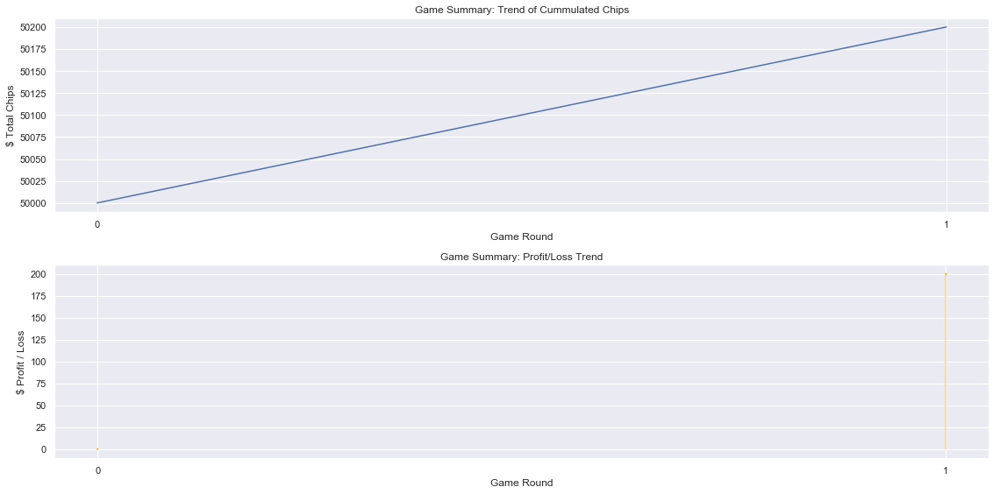

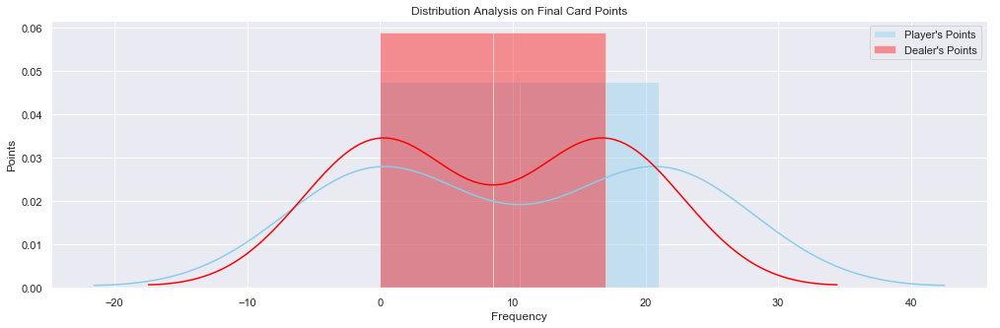

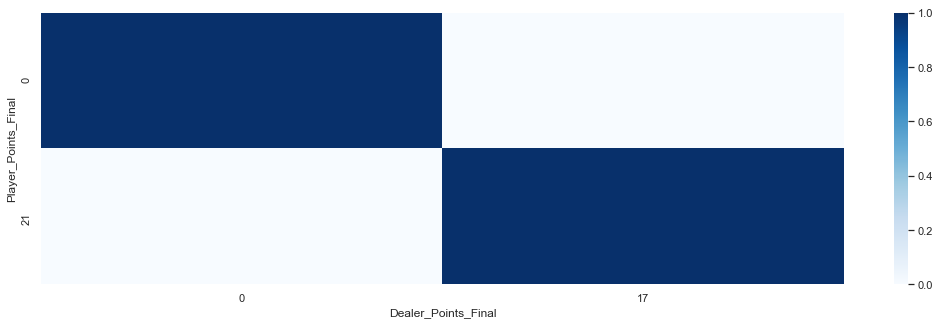

In [47]:
df = game_summary(total_chips = total_chips, LnP = LnP, bid_lst = bid_lst,player_pts_lst=player_pts_lst)

### Game Summary Review (Example: after 1000 rounds)

In [106]:
# code deleted. just change all inputs to fixed inputs i.e.
# cont_ = 'y'
# bid = "int" and any number in string
# action = "stand" all the time

   ======================= GAME SUMMARY =======================


   Number of games       : 1000        Winning Probability: 40.90 %
   Number of games WON   : 409         Initial Chips      : $ 50000
   Number of games LOST  : 447         Final Chips        : $ 46900
   Number of games DRAW  : 144         Total Earning/Loss : $ -3100
   Number of Natural WIN : 104


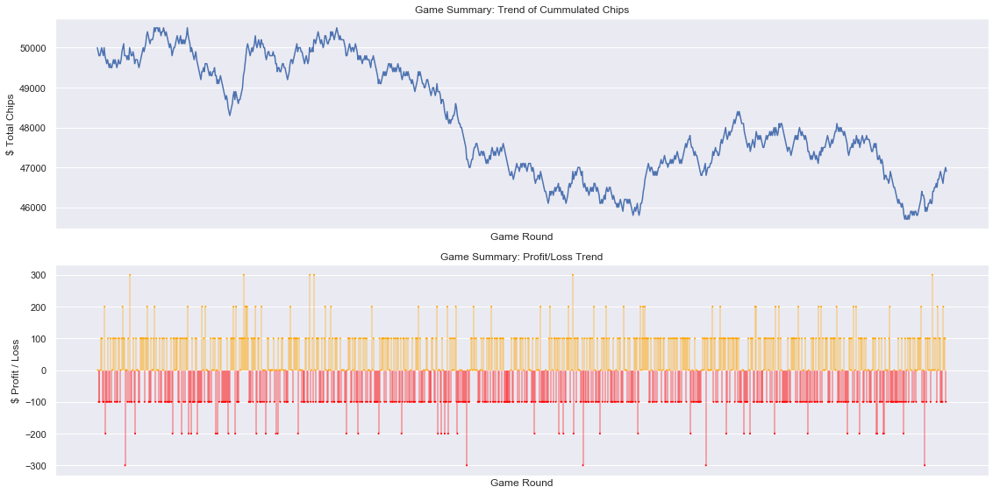

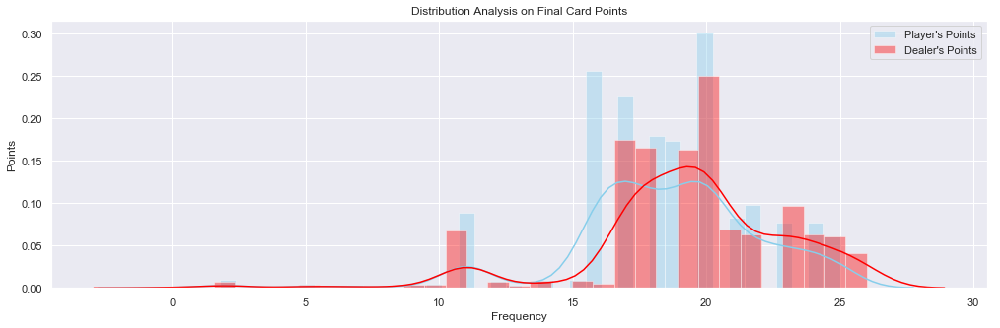

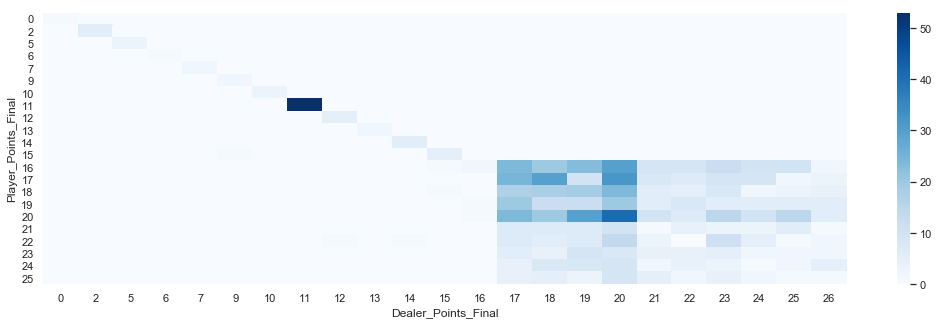

In [24]:
df = game_summary(total_chips = total_chips, LnP = LnP, bid_lst = bid_lst,player_pts_lst=player_pts_lst)

## Showcase of Reinforcement Learning

It has helped to turn loss to profit after learning on ~10,000 games.

In [93]:
# Certain functions will be repeated such that I can start variables anew i.e. Q values

In [94]:
player.player_Q_Values

{(11, 1, True): {1: 0, 0: 0},
 (11, 1, False): {1: 0, 0: 0},
 (11, 2, True): {1: 0, 0: 0},
 (11, 2, False): {1: 0, 0: 0},
 (11, 3, True): {1: 0, 0: 0},
 (11, 3, False): {1: 0, 0: 0},
 (11, 4, True): {1: 0, 0: 0},
 (11, 4, False): {1: 0, 0: 0},
 (11, 5, True): {1: 0, 0: 0},
 (11, 5, False): {1: 0, 0: 0},
 (11, 6, True): {1: 0, 0: 0},
 (11, 6, False): {1: 0, 0: 0},
 (11, 7, True): {1: 0, 0: 0},
 (11, 7, False): {1: 0, 0: 0},
 (11, 8, True): {1: 0, 0: 0},
 (11, 8, False): {1: 0, 0: 0},
 (11, 9, True): {1: 0, 0: 0},
 (11, 9, False): {1: 0, 0: 0},
 (11, 10, True): {1: 0, 0: 0},
 (11, 10, False): {1: 0, 0: 0},
 (12, 1, True): {1: 0, 0: 0},
 (12, 1, False): {1: 0, 0: 0},
 (12, 2, True): {1: 0, 0: 0},
 (12, 2, False): {1: 0, 0: 0},
 (12, 3, True): {1: 0, 0: 0},
 (12, 3, False): {1: 0, 0: 0},
 (12, 4, True): {1: 0, 0: 0},
 (12, 4, False): {1: 0, 0: 0},
 (12, 5, True): {1: 0, 0: 0},
 (12, 5, False): {1: 0, 0: 0},
 (12, 6, True): {1: 0, 0: 0},
 (12, 6, False): {1: 0, 0: 0},
 (12, 7, True): {1: 0,

#### Actual Game Environment (Train for 10,000 games on completely random action with lr=0.1)

In [48]:
vers = 2.00
player = Blackjack()
player.build_deck()
actual_deck = player.full_deck.copy()
player.reset()
player.lr = 0.1
player.exp_rate = 1 #do completely random action

# for Data collection
total_chips = [1000000] #starting
bid_lst = [0]
LnP = [0]
player_pts_lst = [0]
deal_pts_lst = [0]

print(f"$$$ You have starting cash of ${total_chips[-1]}")

for i in range(0,10000):
    player.reset()
    random.shuffle(full_deck)
    actual_deck = full_deck.copy()    
    
    # Bidding input verification
    #bid = input("How much do you want to bid? : ")
    bid = "100"
    while sum([ 1 for j in bid if j not in "0123456789"])>0:
        print("Please enter valid integer.")
        bid = input("How much do you want to bid? : ")
        continue
    bid = eval(bid)
    while bid > total_chips[-1]:
        print("You have no money...")
        bid = input("How much do you want to bid? : ")
        bid = eval(bid)
        continue
    bid_lst.append(bid)
    
    print("\n")
    print(f"************************** Round {i+1} **************************")
    print(f"$$$ You have bidded ${bid}!")
    print(f"$$$ You have remaining ${total_chips[-1] - bid_lst[-1]}!")
    print("\n")
    print(colored("--- Player's Turn ---", 'blue'))
    player_hand = draw_hand(actual_deck)
    dealer_hand = draw_hand(actual_deck)
    play_pts = calculate_pts(player_hand)
    deal_pts = calculate_pts(dealer_hand)
    print(f"You got: {player_hand}")
    
    player.state = max(play_pts), dealer_hand[0] if type(dealer_hand[0]) == int else min(calculate_pts(dealer_hand[0])),True if len(play_pts)>1 else False
    
    # Check for Natural Win
    player.natural_win_player(player_deck = player_hand)
    player.natural_win_dealer(dealer_deck = dealer_hand)
    if player.end_game == True:
        pay = player.natural_winner(bid)
        total_chips.append(total_chips[-1]+pay)
        LnP.append(pay)
        player_pts_lst.append(min(play_pts)) # data collection
        deal_pts_lst.append(min(play_pts)) # data collection
        continue
        
    # Continue if no Natural Win
    # ------------------------------- PLAYER TURN ----------------------------------
    if not player.end_game:
        play_pts = calculate_pts(player_hand)
        display_pts(play_pts)   
        
        action = player.chooseAction()
        if max(play_pts)>11:
            player.player_state_action.append([player.state, action])

        while action and min(play_pts)<=21 and not player.end_turn:
            player_hand = draw_card(actual_deck,player_hand)
            play_pts = calculate_pts(player_hand)
            print(f"You got: {player_hand}")
            display_pts(play_pts)
            player.natural_win_player(player_deck = player_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
            if max(play_pts)<=21:
                player.state = max(play_pts), dealer_hand[0] if type(dealer_hand[0]) == int else min(calculate_pts(dealer_hand[0])),True if len(play_pts)>1 else False
                action = player.chooseAction()
        
    # ------------------------------- DEALER TURN ----------------------------------
    if not player.end_game:
        print(colored("--- Dealer's Turn ---", 'red'))      
        while max(deal_pts) < 17 and len(dealer_hand)<5:
            dealer_hand = draw_card(actual_deck,dealer_hand)
            print("Dealer drew a card...")
            deal_pts = calculate_pts(dealer_hand)
            player.natural_win_dealer(dealer_deck = dealer_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
        
        play_pts = max(play_pts)
        deal_pts = max(deal_pts)
        print(f"Dealer got : {dealer_hand}")
        print(f"Dealer have total of {deal_pts}.")
        print("\n")
        result = compare(play_pts, deal_pts)
        pay = player.winner(result, bid)
        player.end_game = True
        print("\n")
    
    play_pts = max(calculate_pts(player_hand))
    deal_pts = max(calculate_pts(dealer_hand))
    LnP.append(pay)
    total_chips.append(total_chips[-1]+pay)
    player_pts_lst.append(play_pts) # data collection
    deal_pts_lst.append(deal_pts) # data collection

    if not player.player_natwin or not player.dealer_natwin:
        player._giveCredit(play_pts, deal_pts)
   
    #cont_ = input("Continue to next round? Y/N :")
    cont_ = 'y'
    while cont_.lower() not in "yn":
        print("Invalid input. Please enter Y/N.")
        cont_ = input("Continue to next round? Y/N :")   
    if cont_.lower() == 'y':
        continue
    elif cont_.lower() == 'n':
        print("Game ended.")
        # see result
        break

$$$ You have starting cash of $1000000


************************** Round 1 **************************
$$$ You have bidded $100!
$$$ You have remaining $999900!


--- Player's Turn ---
You got: [2, 3]
You have total of 5.
You got: [2, 3, 'K']
You have total of 15.
You got: [2, 3, 'K', 'Q']
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 9, 'Q']
Dealer have total of 26.


IT IS A DRAW!




************************** Round 2 **************************
$$$ You have bidded $100!
$$$ You have remaining $999900!


--- Player's Turn ---
You got: [8, 9]
You have total of 17.
random action 1
You got: [8, 9, 7]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 6, 'Q']
Dealer have total of 26.


IT IS A DRAW!




************************** Round 3 **************************
$$$ You have bidded $100!
$$$ You have remaining $999900!


--- Player's Turn ---
You got: [9, 'A']
You have total of 10 or 20.
random action 1
You got: [9,

You got: [10, 'Q']
You have total of 20.
random action 1
You got: [10, 'Q', 3]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 6, 8]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 96 **************************
$$$ You have bidded $100!
$$$ You have remaining $998300!


--- Player's Turn ---
You got: ['J', 4]
You have total of 14.
You got: ['J', 4, 7]
You have total of 21.
random action 1
You got: ['J', 4, 7, 'A']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [7, 3, 3, 5]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 97 **************************
$$$ You have bidded $100!
$$$ You have remaining $998200!


--- Player's Turn ---
You got: [6, 8]
You have total of 14.
You got: [6, 8, 4]
You have total of 18.
random action 1
You got: [6, 8, 4, 7]
You have total of 25.
--- Dealer's Turn ---
Dealer got : ['J', 'Q']
Dealer have

Dealer have total of 22.


IT IS A DRAW!




************************** Round 169 **************************
$$$ You have bidded $100!
$$$ You have remaining $997000!


--- Player's Turn ---
You got: ['J', 4]
You have total of 14.
You got: ['J', 4, 5]
You have total of 19.
random action 1
You got: ['J', 4, 5, 6]
You have total of 25.
--- Dealer's Turn ---
Dealer got : ['Q', 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 170 **************************
$$$ You have bidded $100!
$$$ You have remaining $996900!


--- Player's Turn ---
You got: [7, 'Q']
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 5, 3]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 171 **************************
$$$ You have bidded $100!
$$$ You have remaining $996800!


--- Player's Turn ---
You got: [3, 9]
You have total of 12.
You got: [3, 9, 3]
You have total of 15.


random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 4, 'J']
Dealer have total of 24.


YOU WON! $100 to your stash.




************************** Round 250 **************************
$$$ You have bidded $100!
$$$ You have remaining $995300!


--- Player's Turn ---
You got: [5, 7]
You have total of 12.
You got: [5, 7, 9]
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 6, 3]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 251 **************************
$$$ You have bidded $100!
$$$ You have remaining $995400!


--- Player's Turn ---
You got: ['K', 7]
You have total of 17.
random action 1
You got: ['K', 7, 6]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 3, 'Q']
Dealer have total of 23.


IT IS A DRAW!




************************** Round 252 **************************
$$$ You have bidded $100!
$$$ You have remaining $995400!






--- Player's Turn ---
You got: [4, 'A']
You have total of 5 or 15.
You got: [4, 'A', 5]
You have total of 10 or 20.
random action 1
You got: [4, 'A', 5, 'A']
You have total of 11.
You got: [4, 'A', 5, 'A', 'K']
You have total of 21.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 336 **************************
$$$ You have bidded $100!
$$$ You have remaining $994800!


--- Player's Turn ---
You got: ['Q', 2]
You have total of 12.
You got: ['Q', 2, 8]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [3, 6, 7, 'K']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 337 **************************
$$$ You have bidded $100!
$$$ You have remaining $994900!


--- Player's Turn ---
You got: [5, 5]
You have total of 10.
You got: [5, 5, 'A']
You have total of 11 or 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Deal

************************** Round 426 **************************
$$$ You have bidded $100!
$$$ You have remaining $992900!


--- Player's Turn ---
You got: ['K', 'K']
You have total of 20.
random action 1
You got: ['K', 'K', 'A']
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 7, 10]
Dealer have total of 20.


YOU WON! $100 to your stash.




************************** Round 427 **************************
$$$ You have bidded $100!
$$$ You have remaining $993000!


--- Player's Turn ---
You got: [6, 10]
You have total of 16.
random action 1
You got: [6, 10, 'Q']
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 5, 9, 6]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 428 **************************
$$$ You have bidded $100!
$$$ You have remaining $993000!


--- Player's Turn ---
You got: [4, 7]
You have total of 11.
You got: [4, 7, 3]
You have total of 14

Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 497 **************************
$$$ You have bidded $100!
$$$ You have remaining $990800!


--- Player's Turn ---
You got: ['A', 'K']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 498 **************************
$$$ You have bidded $100!
$$$ You have remaining $991000!


--- Player's Turn ---
You got: [3, 'A']
You have total of 4 or 14.
You got: [3, 'A', 5]
You have total of 9 or 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 4, 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 499 **************************
$$$ You have bidded $100!
$$$ You have remaining $990900!


--- Player's Turn ---
You got: ['A', 2]
You have total of 3 or 13.
You got: ['A', 2, 9]
You have total of 12.
You got: ['A', 2, 9, 2]
You have total of 14.
You got: ['A', 2, 9, 2, 6]
You have total of 20.
You got 



YOU WON! $100 to your stash.




************************** Round 582 **************************
$$$ You have bidded $100!
$$$ You have remaining $990600!


--- Player's Turn ---
You got: [3, 'A']
You have total of 4 or 14.
You got: [3, 'A', 6]
You have total of 10 or 20.
random action 1
You got: [3, 'A', 6, 'K']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 7, 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 583 **************************
$$$ You have bidded $100!
$$$ You have remaining $990700!


--- Player's Turn ---
You got: [9, 2]
You have total of 11.
You got: [9, 2, 6]
You have total of 17.
random action 1
You got: [9, 2, 6, 9]
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 5, 'Q']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 584 **************************
$$$ You have bidded $100!
$$$ You have

Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 684 **************************
$$$ You have bidded $100!
$$$ You have remaining $989600!


--- Player's Turn ---
You got: [9, 'J']
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 5, 4]
Dealer have total of 19.


IT IS A DRAW!




************************** Round 685 **************************
$$$ You have bidded $100!
$$$ You have remaining $989600!


--- Player's Turn ---
You got: [6, 'K']
You have total of 16.
random action 1
You got: [6, 'K', 7]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 7, 6]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 686 **************************
$$$ You have bidded $100!
$$$ You have remaining $989500!


--- Player's Turn ---
You got: ['J', 8]
You have total of 18.
random action 1
You got: ['J', 8, 4]
You have total of 22.
---

--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'K', 8]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 774 **************************
$$$ You have bidded $100!
$$$ You have remaining $985300!


--- Player's Turn ---
You got: [4, 6]
You have total of 10.
You got: [4, 6, 2]
You have total of 12.
You got: [4, 6, 2, 8]
You have total of 20.
random action 1
You got: [4, 6, 2, 8, 2]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [10, 2, 4, 6]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 775 **************************
$$$ You have bidded $100!
$$$ You have remaining $985300!


--- Player's Turn ---
You got: ['Q', 9]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 'A', 6]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 776 **************************
$$$ You have bidded

You have total of 13.
You got: ['K', 3, 10]
You have total of 23.
--- Dealer's Turn ---
Dealer got : [7, 'Q']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 887 **************************
$$$ You have bidded $100!
$$$ You have remaining $982500!


--- Player's Turn ---
You got: [10, 3]
You have total of 13.
You got: [10, 3, 9]
You have total of 22.
--- Dealer's Turn ---
Dealer got : ['K', 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 888 **************************
$$$ You have bidded $100!
$$$ You have remaining $982400!


--- Player's Turn ---
You got: [2, 9]
You have total of 11.
You got: [2, 9, 2]
You have total of 13.
You got: [2, 9, 2, 'J']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [8, 6, 'A', 'J']
Dealer have total of 25.


IT IS A DRAW!




************************** Round 889 **************************
$$$ You have bidded

Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 989 **************************
$$$ You have bidded $100!
$$$ You have remaining $978600!


--- Player's Turn ---
You got: [6, 3]
You have total of 9.
You got: [6, 3, 4]
You have total of 13.
You got: [6, 3, 4, 'Q']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 8, 5, 9]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 990 **************************
$$$ You have bidded $100!
$$$ You have remaining $978600!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
random action 1
You got: [10, 9, 'Q']
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU LOST! $-200 to your stash.
Dealer got : ['A', 2, 3, 4, 'Q']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 991 ******************

You got: ['J', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 1078 **************************
$$$ You have bidded $100!
$$$ You have remaining $976600!


--- Player's Turn ---
You got: ['Q', 9]
You have total of 19.
random action 1
You got: ['Q', 9, 'A']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 2, 6]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 1079 **************************
$$$ You have bidded $100!
$$$ You have remaining $976700!


--- Player's Turn ---
You got: ['Q', 10]
You have total of 20.
random action 1
You got: ['Q', 10, 'Q']
You have total of 30.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 3, 5]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 1080 **************************
$$$ You have bidded $100!
$$$ You have remaining $976600!


--- Player's Turn ---
You got: [

You have total of 13.
You got: [7, 5, 'A', 10]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['A', 5, 3]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 1186 **************************
$$$ You have bidded $100!
$$$ You have remaining $974600!


--- Player's Turn ---
You got: ['A', 4]
You have total of 5 or 15.
You got: ['A', 4, 9]
You have total of 14.
You got: ['A', 4, 9, 7]
You have total of 21.
random action 1
You got: ['A', 4, 9, 7, 10]
You have total of 31.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 5, 'K']
Dealer have total of 25.


IT IS A DRAW!




************************** Round 1187 **************************
$$$ You have bidded $100!
$$$ You have remaining $974600!


--- Player's Turn ---
You got: [10, 4]
You have total of 14.
You got: [10, 4, 'A']
You have total of 15.
You got: [10, 4, 'A', 8]
You have total of 23.
--- Dealer's Turn ---
Dealer got : [8, 9]
Dealer have total o

$$$ You have bidded $100!
$$$ You have remaining $971800!


--- Player's Turn ---
You got: [3, 3]
You have total of 6.
You got: [3, 3, 10]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 7, 10]
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 1298 **************************
$$$ You have bidded $100!
$$$ You have remaining $971900!


--- Player's Turn ---
You got: [6, 'K']
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 'J']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 1299 **************************
$$$ You have bidded $100!
$$$ You have remaining $971800!


--- Player's Turn ---
You got: [9, 3]
You have total of 12.
You got: [9, 3, 9]
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 4, 2, 7]
Dealer have total of 19.


YOU WON! $100 to your s

You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 10, 4]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 1404 **************************
$$$ You have bidded $100!
$$$ You have remaining $970500!


--- Player's Turn ---
You got: [3, 9]
You have total of 12.
You got: [3, 9, 7]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 2, 10, 'A']
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 1405 **************************
$$$ You have bidded $100!
$$$ You have remaining $970600!


--- Player's Turn ---
You got: [8, 10]
You have total of 18.
random action 1
You got: [8, 10, 'A']
You have total of 19.
random action 1
You got: [8, 10, 'A', 3]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'Q', 8]
Dealer have total of 24.


IT IS A DRAW!




************

$$$ You have remaining $968200!


--- Player's Turn ---
You got: ['A', 8]
You have total of 9 or 19.
random action 1
You got: ['A', 8, 'A']
You have total of 10 or 20.
random action 0
--- Dealer's Turn ---
Dealer got : [10, 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 1509 **************************
$$$ You have bidded $100!
$$$ You have remaining $968300!


--- Player's Turn ---
You got: ['Q', 5]
You have total of 15.
You got: ['Q', 5, 9]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [5, 7, 2, 8]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 1510 **************************
$$$ You have bidded $100!
$$$ You have remaining $968300!


--- Player's Turn ---
You got: [6, 'A']
You have total of 7 or 17.
random action 1
You got: [6, 'A', 9]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer got : [10, 7]
Dealer have total of 17.


YOU LOST!



************************** Round 1597 **************************
$$$ You have bidded $100!
$$$ You have remaining $968300!


--- Player's Turn ---
You got: [10, 2]
You have total of 12.
You got: [10, 2, 8]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 1598 **************************
$$$ You have bidded $100!
$$$ You have remaining $968400!


--- Player's Turn ---
You got: [5, 'J']
You have total of 15.
You got: [5, 'J', 'Q']
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 7, 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 1599 **************************
$$$ You have bidded $100!
$$$ You have remaining $968300!


--- Player's Turn ---
You got: ['K', 3]
You have total of 13.
You got: ['K', 3, 'J']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : 

************************** Round 1702 **************************
$$$ You have bidded $100!
$$$ You have remaining $966100!


--- Player's Turn ---
You got: [9, 9]
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 8, 5]
Dealer have total of 18.


IT IS A DRAW!




************************** Round 1703 **************************
$$$ You have bidded $100!
$$$ You have remaining $966100!


--- Player's Turn ---
You got: [7, 'K']
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 10, 'J']
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 1704 **************************
$$$ You have bidded $100!
$$$ You have remaining $966200!


--- Player's Turn ---
You got: ['Q', 10]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU LOST! $-200 to your stash.
Dealer got :

random action 0
--- Dealer's Turn ---
Dealer got : ['J', 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 1789 **************************
$$$ You have bidded $100!
$$$ You have remaining $965300!


--- Player's Turn ---
You got: [9, 3]
You have total of 12.
You got: [9, 3, 8]
You have total of 20.
random action 1
You got: [9, 3, 8, 9]
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['K', 2, 3, 5]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 1790 **************************
$$$ You have bidded $100!
$$$ You have remaining $965200!


--- Player's Turn ---
You got: [3, 8]
You have total of 11.
You got: [3, 8, 8]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer got : [9, 'K']
Dealer have total of 19.


IT IS A DRAW!




************************** Round 1791 **************************
$$$ You have bidded $100!
$$$ You have rem


************************** Round 1887 **************************
$$$ You have bidded $100!
$$$ You have remaining $963100!


--- Player's Turn ---
You got: [3, 'A']
You have total of 4 or 14.
You got: [3, 'A', 'A']
You have total of 5 or 15.
You got: [3, 'A', 'A', 'K']
You have total of 15.
You got: [3, 'A', 'A', 'K', 10]
You have total of 25.
--- Dealer's Turn ---
Dealer got : [7, 'A']
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 1888 **************************
$$$ You have bidded $100!
$$$ You have remaining $963000!


--- Player's Turn ---
You got: ['K', 4]
You have total of 14.
You got: ['K', 4, 'Q']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['J', 2, 'A', 10]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 1889 **************************
$$$ You have bidded $100!
$$$ You have remaining $963000!


--- Player's Turn ---
You got: ['K', 5]
You have

You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 3, 8]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 1983 **************************
$$$ You have bidded $100!
$$$ You have remaining $962300!


--- Player's Turn ---
You got: [10, 9]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 1984 **************************
$$$ You have bidded $100!
$$$ You have remaining $962100!


--- Player's Turn ---
You got: [2, 5]
You have total of 7.
You got: [2, 5, 9]
You have total of 16.
random action 1
You got: [2, 5, 9, 4]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [10, 3, 'A', 8]
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 1985 **************************
$$$ You have bidded $100!
$$$ You have remaining $962200!


--- Player's Turn ---
You got: [8, 4]
You have tot

You got: [5, 3]
You have total of 8.
You got: [5, 3, 2]
You have total of 10.
You got: [5, 3, 2, 'K']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : ['J', 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 2096 **************************
$$$ You have bidded $100!
$$$ You have remaining $958300!


--- Player's Turn ---
You got: [3, 'J']
You have total of 13.
You got: [3, 'J', 6]
You have total of 19.
random action 1
You got: [3, 'J', 6, 'Q']
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 10, 9]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 2097 **************************
$$$ You have bidded $100!
$$$ You have remaining $958300!


--- Player's Turn ---
You got: [4, 'Q']
You have total of 14.
You got: [4, 'Q', 3]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 8, 'K']
Dealer have total of 25.


YOU WON

random action 1
You got: [4, 6, 8, 7]
You have total of 25.
--- Dealer's Turn ---
Dealer got : [7, 'J']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 2208 **************************
$$$ You have bidded $100!
$$$ You have remaining $957100!


--- Player's Turn ---
You got: [2, 3]
You have total of 5.
You got: [2, 3, 6]
You have total of 11.
You got: [2, 3, 6, 8]
You have total of 19.
random action 1
You got: [2, 3, 6, 8, 10]
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [5, 2, 3, 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 2209 **************************
$$$ You have bidded $100!
$$$ You have remaining $957000!


--- Player's Turn ---
You got: ['K', 4]
You have total of 14.
You got: ['K', 4, 4]
You have total of 18.
random action 1
You got: ['K', 4, 4, 'J']
You have total of 28.
--- Dealer's Turn ---
Dealer drew a card...
Dealer 

You got: [5, 8, 'A', 3]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 'A', 4]
Dealer have total of 17.


IT IS A DRAW!




************************** Round 2317 **************************
$$$ You have bidded $100!
$$$ You have remaining $955000!


--- Player's Turn ---
You got: [6, 8]
You have total of 14.
You got: [6, 8, 3]
You have total of 17.
random action 1
You got: [6, 8, 3, 6]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 7, 'Q']
Dealer have total of 22.


IT IS A DRAW!




************************** Round 2318 **************************
$$$ You have bidded $100!
$$$ You have remaining $955000!


--- Player's Turn ---
You got: [4, 5]
You have total of 9.
You got: [4, 5, 3]
You have total of 12.
You got: [4, 5, 3, 9]
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['Q', 5, 'A', 6]
Dealer have total of 22.


YOU WON! $100 to



--- Player's Turn ---
You got: ['Q', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 2433 **************************
$$$ You have bidded $100!
$$$ You have remaining $951100!


--- Player's Turn ---
You got: [9, 10]
You have total of 19.
random action 1
You got: [9, 10, 2]
You have total of 21.
random action 1
You got: [9, 10, 2, 10]
You have total of 31.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 'Q', 2, 7]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 2434 **************************
$$$ You have bidded $100!
$$$ You have remaining $951100!


--- Player's Turn ---
You got: [6, 'A']
You have total of 7 or 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 3, 2, 'K']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 2435 **************************
$$$ You have bidded $100!
$$$ You

You got: ['J', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 2543 **************************
$$$ You have bidded $100!
$$$ You have remaining $949500!


--- Player's Turn ---
You got: [3, 'J']
You have total of 13.
You got: [3, 'J', 2]
You have total of 15.
You got: [3, 'J', 2, 8]
You have total of 23.
--- Dealer's Turn ---
Dealer got : [9, 'J']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2544 **************************
$$$ You have bidded $100!
$$$ You have remaining $949400!


--- Player's Turn ---
You got: [5, 'K']
You have total of 15.
You got: [5, 'K', 'J']
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 4, 10]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2545 **************************
$$$ You have bidded $100!
$$$ You have remaining $949300!


--- Player's Turn ---
You got: [8, 6]
You have total of 14.
Yo

--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 3, 'K']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2654 **************************
$$$ You have bidded $100!
$$$ You have remaining $946600!


--- Player's Turn ---
You got: [6, 6]
You have total of 12.
You got: [6, 6, 'A']
You have total of 13.
You got: [6, 6, 'A', 'A']
You have total of 14.
You got: [6, 6, 'A', 'A', 9]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 3, 'Q']
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 2655 **************************
$$$ You have bidded $100!
$$$ You have remaining $946500!


--- Player's Turn ---
You got: [7, 'K']
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 6, 4]
Dealer have total of 17.


IT IS A DRAW!




************************** Round 2656 **************************
$$$ You have bidded $100!
$$$ Y

Dealer got : [9, 'K']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2766 **************************
$$$ You have bidded $100!
$$$ You have remaining $944600!


--- Player's Turn ---
You got: [6, 8]
You have total of 14.
You got: [6, 8, 8]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 9, 'J']
Dealer have total of 23.


IT IS A DRAW!




************************** Round 2767 **************************
$$$ You have bidded $100!
$$$ You have remaining $944600!


--- Player's Turn ---
You got: [9, 7]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 10, 6]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 2768 **************************
$$$ You have bidded $100!
$$$ You have remaining $944500!


--- Player's Turn ---
You got: ['K', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Ro

$$$ You have remaining $943500!


--- Player's Turn ---
You got: [4, 6]
You have total of 10.
You got: [4, 6, 5]
You have total of 15.
You got: [4, 6, 5, 9]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'Q', 8]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 2875 **************************
$$$ You have bidded $100!
$$$ You have remaining $943500!


--- Player's Turn ---
You got: ['A', 5]
You have total of 6 or 16.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2876 **************************
$$$ You have bidded $100!
$$$ You have remaining $943400!


--- Player's Turn ---
You got: [6, 'K']
You have total of 16.
random action 1
You got: [6, 'K', 'J']
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 4, 'Q']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




**************

--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 5, 7]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 2984 **************************
$$$ You have bidded $100!
$$$ You have remaining $940800!


--- Player's Turn ---
You got: [10, 'K']
You have total of 20.
random action 1
You got: [10, 'K', 'Q']
You have total of 30.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 'A', 7, 5]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 2985 **************************
$$$ You have bidded $100!
$$$ You have remaining $940700!


--- Player's Turn ---
You got: [3, 10]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 2986 **************************
$$$ You have bidded $100!
$$$ You have remaining $940500!


--- Player's Turn ---
You got: ['J', 4]
You have total of 14.
You got: ['J', 4, 2]
You have total of 16.
random action 0
-

Dealer got : [4, 7, 'J']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 3096 **************************
$$$ You have bidded $100!
$$$ You have remaining $936600!


--- Player's Turn ---
You got: [8, 4]
You have total of 12.
You got: [8, 4, 'Q']
You have total of 22.
--- Dealer's Turn ---
Dealer got : [10, 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 3097 **************************
$$$ You have bidded $100!
$$$ You have remaining $936500!


--- Player's Turn ---
You got: ['A', 2]
You have total of 3 or 13.
You got: ['A', 2, 5]
You have total of 8 or 18.
random action 1
You got: ['A', 2, 5, 8]
You have total of 16.
random action 1
You got: ['A', 2, 5, 8, 5]
You have total of 21.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 3098 **************************
$$$ You have bidded $100!
$$$ You have remaining $936700!


--- Player's Turn ---
You got: [9, 8]
You

Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 'A', 10, 6]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 3203 **************************
$$$ You have bidded $100!
$$$ You have remaining $935600!


--- Player's Turn ---
You got: ['J', 7]
You have total of 17.
random action 1
You got: ['J', 7, 'A']
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 8]
Dealer have total of 18.


IT IS A DRAW!




************************** Round 3204 **************************
$$$ You have bidded $100!
$$$ You have remaining $935600!


--- Player's Turn ---
You got: [9, 'K']
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 10, 10]
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 3205 **************************
$$$ You have bidded $100!
$$$ You have remaining $935700!


--- Player's Turn ---
You got: [3, 8]
Dealer got Ban Lu

--- Player's Turn ---
You got: [6, 'Q']
Dealer got Ban Ban!
YOU LOST! $-300 to your stash.


************************** Round 3314 **************************
$$$ You have bidded $100!
$$$ You have remaining $934500!


--- Player's Turn ---
You got: ['A', 'Q']
You got Ban Luck!
Dealer got Ban Luck!
IT IS A DRAW!


************************** Round 3315 **************************
$$$ You have bidded $100!
$$$ You have remaining $934500!


--- Player's Turn ---
You got: ['J', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 3316 **************************
$$$ You have bidded $100!
$$$ You have remaining $934700!


--- Player's Turn ---
You got: ['J', 10]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 'K', 'J']
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 3317 **************************
$$$ You have bidded $100!
$$$ You have remaining $934800!


--- Playe


YOU LOST! $-100 to your stash.




************************** Round 3423 **************************
$$$ You have bidded $100!
$$$ You have remaining $932000!


--- Player's Turn ---
You got: [6, 4]
You have total of 10.
You got: [6, 4, 4]
You have total of 14.
You got: [6, 4, 4, 10]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['Q', 3, 2, 5]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 3424 **************************
$$$ You have bidded $100!
$$$ You have remaining $931900!


--- Player's Turn ---
You got: [10, 2]
You have total of 12.
You got: [10, 2, 'Q']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [9, 5, 'A', 7]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 3425 **************************
$$$ You have bidded $100!
$$$ You have remaining $931900!


--- Player's Turn ---
You got: [9, 8]
You h

random action 1
You got: [5, 'A', 9]
You have total of 15.
You got: [5, 'A', 9, 4]
You have total of 19.
random action 1
You got: [5, 'A', 9, 4, 7]
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 8, 7]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 3536 **************************
$$$ You have bidded $100!
$$$ You have remaining $931100!


--- Player's Turn ---
You got: [9, 'K']
You have total of 19.
random action 1
You got: [9, 'K', 10]
You have total of 29.
--- Dealer's Turn ---
Dealer got : ['A', 7]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 3537 **************************
$$$ You have bidded $100!
$$$ You have remaining $931000!


--- Player's Turn ---
You got: [6, 'A']
You have total of 7 or 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 8, 10]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




**********




************************** Round 3643 **************************
$$$ You have bidded $100!
$$$ You have remaining $928400!


--- Player's Turn ---
You got: [8, 2]
You have total of 10.
You got: [8, 2, 7]
You have total of 17.
random action 1
You got: [8, 2, 7, 'A']
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer got : ['J', 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 3644 **************************
$$$ You have bidded $100!
$$$ You have remaining $928300!


--- Player's Turn ---
You got: ['K', 'Q']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['A', 2, 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 3645 **************************
$$$ You have bidded $100!
$$$ You have remaining $928200!


--- Player's Turn ---
You got: ['Q', 6]
You have total of 16.
random action 1
You got: ['Q', 6, 7]
You have total of 23.
---



YOU LOST! $-100 to your stash.




************************** Round 3757 **************************
$$$ You have bidded $100!
$$$ You have remaining $925400!


--- Player's Turn ---
You got: ['J', 4]
You have total of 14.
You got: ['J', 4, 2]
You have total of 16.
random action 1
You got: ['J', 4, 2, 8]
You have total of 24.
--- Dealer's Turn ---
Dealer got : ['A', 8]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 3758 **************************
$$$ You have bidded $100!
$$$ You have remaining $925300!


--- Player's Turn ---
You got: ['A', 10]
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 3759 **************************
$$$ You have bidded $100!
$$$ You have remaining $925500!


--- Player's Turn ---
You got: [6, 'J']
You have total of 16.
random action 1
You got: [6, 'J', 'J']
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 2, 7]
Dealer have total of 18.


YOU LOST

$$$ You have remaining $922100!


--- Player's Turn ---
You got: [3, 'A']
You have total of 4 or 14.
You got: [3, 'A', 'A']
You have total of 5 or 15.
You got: [3, 'A', 'A', 5]
You have total of 10.
You got: [3, 'A', 'A', 5, 5]
You have total of 15.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 3865 **************************
$$$ You have bidded $100!
$$$ You have remaining $922300!


--- Player's Turn ---
You got: ['J', 6]
You have total of 16.
random action 1
You got: ['J', 6, 5]
You have total of 21.
random action 1
You got: ['J', 6, 5, 'K']
You have total of 31.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 9, 'K']
Dealer have total of 23.


IT IS A DRAW!




************************** Round 3866 **************************
$$$ You have bidded $100!
$$$ You have remaining $922300!


--- Player's Turn ---
You got: [6, 'J']
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 9, 'K']
Dealer 





************************** Round 3973 **************************
$$$ You have bidded $100!
$$$ You have remaining $918200!


--- Player's Turn ---
You got: ['A', 'J']
You got Ban Luck!
Dealer got Ban Luck!
IT IS A DRAW!


************************** Round 3974 **************************
$$$ You have bidded $100!
$$$ You have remaining $918200!


--- Player's Turn ---
You got: ['J', 10]
You have total of 20.
random action 1
You got: ['J', 10, 'J']
You have total of 30.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 2, 7, 5]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 3975 **************************
$$$ You have bidded $100!
$$$ You have remaining $918100!


--- Player's Turn ---
You got: [7, 'A']
You have total of 8 or 18.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['A', 3, 'Q', 'J']
Dealer have total of 24.


YOU WON! $100 to your stash.




****

--- Player's Turn ---
You got: ['J', 7]
You have total of 17.
random action 1
You got: ['J', 7, 3]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : ['J', 10]
Dealer have total of 20.


IT IS A DRAW!




************************** Round 4085 **************************
$$$ You have bidded $100!
$$$ You have remaining $915900!


--- Player's Turn ---
You got: [2, 8]
You have total of 10.
You got: [2, 8, 'Q']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [9, 3, 4, 9]
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 4086 **************************
$$$ You have bidded $100!
$$$ You have remaining $916000!


--- Player's Turn ---
You got: [9, 'A']
You have total of 10 or 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 8, 'K']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 4087 *



YOU WON! $100 to your stash.




************************** Round 4194 **************************
$$$ You have bidded $100!
$$$ You have remaining $914700!


--- Player's Turn ---
You got: [7, 3]
You have total of 10.
You got: [7, 3, 'K']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 8, 2, 2]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 4195 **************************
$$$ You have bidded $100!
$$$ You have remaining $914800!


--- Player's Turn ---
You got: ['K', 4]
You have total of 14.
You got: ['K', 4, 5]
You have total of 19.
random action 1
You got: ['K', 4, 5, 10]
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 7, 'Q']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 4196 **************************
$$$ You have bidded $100!
$$$ You have remaining $914700!


--- Player's Turn --

--- Player's Turn ---
You got: ['J', 'J']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 9]
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 4303 **************************
$$$ You have bidded $100!
$$$ You have remaining $912400!


--- Player's Turn ---
You got: ['A', 'Q']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 4304 **************************
$$$ You have bidded $100!
$$$ You have remaining $912600!


--- Player's Turn ---
You got: ['A', 5]
You have total of 6 or 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'Q', 3]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 4305 **************************
$$$ You have bidded $100!
$$$ You have remaining $912500!


--- Player's Turn ---
You got: ['K', 7]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer got : ['Q', 8]
Dealer have to

random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'J', 'Q']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 4414 **************************
$$$ You have bidded $100!
$$$ You have remaining $911000!


--- Player's Turn ---
You got: ['A', 'J']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 4415 **************************
$$$ You have bidded $100!
$$$ You have remaining $911200!


--- Player's Turn ---
You got: [9, 'A']
You have total of 10 or 20.
random action 1
You got: [9, 'A', 9]
You have total of 19.
random action 1
You got: [9, 'A', 9, 4]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 4, 'K']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 4416 **************************
$$$ You have bidded $100!
$$$ You have remaining $911100!


--- Player's Turn ---
You got: [5, 3]
You have total of 8.
You got:




************************** Round 4525 **************************
$$$ You have bidded $100!
$$$ You have remaining $908100!


--- Player's Turn ---
You got: ['J', 4]
You have total of 14.
You got: ['J', 4, 'A']
You have total of 15.
You got: ['J', 4, 'A', 9]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 3, 9]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 4526 **************************
$$$ You have bidded $100!
$$$ You have remaining $908000!


--- Player's Turn ---
You got: [7, 'K']
You have total of 17.
random action 1
You got: [7, 'K', 'A']
You have total of 18.
random action 1
You got: [7, 'K', 'A', 3]
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 3, 5]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 4527 **************************
$$$ You have bidded $100!
$$$ You have remaining $908100!


--- Pl



--- Player's Turn ---
You got: [3, 4]
You have total of 7.
You got: [3, 4, 'K']
You have total of 17.
random action 1
You got: [3, 4, 'K', 'Q']
You have total of 27.
--- Dealer's Turn ---
Dealer got : [6, 'A']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 4637 **************************
$$$ You have bidded $100!
$$$ You have remaining $905800!


--- Player's Turn ---
You got: [5, 5]
You have total of 10.
You got: [5, 5, 'J']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 4, 'J']
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 4638 **************************
$$$ You have bidded $100!
$$$ You have remaining $905900!


--- Player's Turn ---
You got: [8, 'Q']
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 5, 10]
Dealer have total of 17.


YOU WON! $100 to your stash.




**********************

YOU WON! $100 to your stash.




************************** Round 4747 **************************
$$$ You have bidded $100!
$$$ You have remaining $903100!


--- Player's Turn ---
You got: [4, 7]
You have total of 11.
You got: [4, 7, 6]
You have total of 17.
random action 1
You got: [4, 7, 6, 10]
You have total of 27.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['K', 2, 'K']
Dealer have total of 22.


IT IS A DRAW!




************************** Round 4748 **************************
$$$ You have bidded $100!
$$$ You have remaining $903100!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
random action 1
You got: [10, 9, 3]
You have total of 22.
--- Dealer's Turn ---
Dealer got : ['J', 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 4749 **************************
$$$ You have bidded $100!
$$$ You have remaining $903000!


--- Player's Turn ---
You got: [3, 5]
You have total of 8.
You got: [3, 5, 6]
You have to

random action 1
You got: [8, 'Q', 9]
You have total of 27.
--- Dealer's Turn ---
Dealer got : ['K', 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 4859 **************************
$$$ You have bidded $100!
$$$ You have remaining $899700!


--- Player's Turn ---
You got: [5, 2]
You have total of 7.
You got: [5, 2, 9]
You have total of 16.
random action 1
You got: [5, 2, 9, 8]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 3, 'K']
Dealer have total of 23.


IT IS A DRAW!




************************** Round 4860 **************************
$$$ You have bidded $100!
$$$ You have remaining $899700!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
random action 1
You got: [10, 9, 'A']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : [10, 'J']
Dealer have total of 20.


IT IS A DRAW!




************************** Round 4861 **************************
$$$ You have bidd

YOU LOST! $-100 to your stash.




************************** Round 4965 **************************
$$$ You have bidded $100!
$$$ You have remaining $898900!


--- Player's Turn ---
You got: ['A', 3]
You have total of 4 or 14.
You got: ['A', 3, 'Q']
You have total of 14.
You got: ['A', 3, 'Q', 7]
You have total of 21.
random action 1
You got: ['A', 3, 'Q', 7, 6]
You have total of 27.
--- Dealer's Turn ---
Dealer got : ['K', 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 4966 **************************
$$$ You have bidded $100!
$$$ You have remaining $898800!


--- Player's Turn ---
You got: [7, 5]
You have total of 12.
You got: [7, 5, 8]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 7, 3, 'Q']
Dealer have total of 24.


YOU WON! $100 to your stash.




************************** Round 4967 **************************
$$$ You have bidded $100!
$$$ You have remaini

Dealer drew a card...
Dealer got : [3, 10, 4]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 5057 **************************
$$$ You have bidded $100!
$$$ You have remaining $896800!


--- Player's Turn ---
You got: ['J', 'J']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : [8, 9]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 5058 **************************
$$$ You have bidded $100!
$$$ You have remaining $896900!


--- Player's Turn ---
You got: [8, 5]
You have total of 13.
You got: [8, 5, 9]
You have total of 22.
--- Dealer's Turn ---
Dealer got : [9, 'A']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 5059 **************************
$$$ You have bidded $100!
$$$ You have remaining $896800!


--- Player's Turn ---
You got: [2, 'Q']
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 5

You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['A', 3, 'Q', 3]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 5172 **************************
$$$ You have bidded $100!
$$$ You have remaining $894100!


--- Player's Turn ---
You got: ['Q', 7]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [5, 4, 3, 'Q']
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 5173 **************************
$$$ You have bidded $100!
$$$ You have remaining $894200!


--- Player's Turn ---
You got: ['J', 10]
You have total of 20.
random action 1
You got: ['J', 10, 9]
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 3, 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 5174 **************************
$$$ You have bidded $

Dealer have total of 20.


IT IS A DRAW!




************************** Round 5283 **************************
$$$ You have bidded $100!
$$$ You have remaining $890600!


--- Player's Turn ---
You got: [5, 4]
You have total of 9.
You got: [5, 4, 'K']
You have total of 19.
random action 1
You got: [5, 4, 'K', 'K']
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU LOST! $-200 to your stash.
Dealer got : ['A', 2, 3, 'J', 5]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 5284 **************************
$$$ You have bidded $100!
$$$ You have remaining $890500!


--- Player's Turn ---
You got: [5, 5]
You have total of 10.
You got: [5, 5, 9]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 4, 2, 'Q']
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 52

random action 1
You got: [5, 10, 2, 3, 3]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 6, 7, 3]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 5365 **************************
$$$ You have bidded $100!
$$$ You have remaining $888800!


--- Player's Turn ---
You got: [4, 'J']
You have total of 14.
You got: [4, 'J', 'Q']
You have total of 24.
--- Dealer's Turn ---
Dealer got : [7, 'K']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 5366 **************************
$$$ You have bidded $100!
$$$ You have remaining $888700!


--- Player's Turn ---
You got: [6, 6]
You have total of 12.
You got: [6, 6, 2]
You have total of 14.
You got: [6, 6, 2, 3]
You have total of 17.
random action 1
You got: [6, 6, 2, 3, 4]
You have total of 21.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 5367 **************************

Dealer got : [6, 'K', 'J']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 5477 **************************
$$$ You have bidded $100!
$$$ You have remaining $887700!


--- Player's Turn ---
You got: [10, 5]
You have total of 15.
You got: [10, 5, 'Q']
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 3, 4]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 5478 **************************
$$$ You have bidded $100!
$$$ You have remaining $887600!


--- Player's Turn ---
You got: [6, 7]
You have total of 13.
You got: [6, 7, 4]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['A', 5, 3]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 5479 **************************
$$$ You have bidded $100!
$$$ You have remaining $887500!


--- Player's Turn ---
You got: [9, 'Q']
You have total

random action 1
You got: ['A', 8, 'A', 7, 2]
You have total of 19.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 5590 **************************
$$$ You have bidded $100!
$$$ You have remaining $882900!


--- Player's Turn ---
You got: [7, 'J']
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['Q', 4, 2, 2]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 5591 **************************
$$$ You have bidded $100!
$$$ You have remaining $882800!


--- Player's Turn ---
You got: [9, 8]
You have total of 17.
random action 1
You got: [9, 8, 9]
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['A', 4, 7, 'K']
Dealer have total of 22.


IT IS A DRAW!




************************** Round 5592 **************************
$$$ You have bidded $100!
$$$ You have remaining $882800!


--- Player's Turn -

************************** Round 5700 **************************
$$$ You have bidded $100!
$$$ You have remaining $880400!


--- Player's Turn ---
You got: [4, 9]
You have total of 13.
You got: [4, 9, 5]
You have total of 18.
random action 1
You got: [4, 9, 5, 'K']
You have total of 28.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 7, 3]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 5701 **************************
$$$ You have bidded $100!
$$$ You have remaining $880300!


--- Player's Turn ---
You got: ['Q', 'K']
You have total of 20.
random action 1
You got: ['Q', 'K', 9]
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 9, 'A', 5]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 5702 **************************
$$$ You have bidded $100!
$$$ You have remaining $880200!


--- Player's Turn ---
You got: ['J', 'K']
You have t

You got: ['Q', 3, 'A', 'J']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU LOST! $-200 to your stash.
Dealer got : [2, 4, 2, 7, 5]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 5812 **************************
$$$ You have bidded $100!
$$$ You have remaining $878300!


--- Player's Turn ---
You got: [10, 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 5813 **************************
$$$ You have bidded $100!
$$$ You have remaining $878500!


--- Player's Turn ---
You got: [10, 3]
You have total of 13.
You got: [10, 3, 3]
You have total of 16.
random action 1
You got: [10, 3, 3, 9]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 8, 2, 'A']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 5814 ***********************

random action 0
--- Dealer's Turn ---
Dealer got : [7, 'K']
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 5926 **************************
$$$ You have bidded $100!
$$$ You have remaining $878000!


--- Player's Turn ---
You got: [9, 'K']
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 'K', 'Q']
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 5927 **************************
$$$ You have bidded $100!
$$$ You have remaining $878100!


--- Player's Turn ---
You got: [3, 6]
You have total of 9.
You got: [3, 6, 7]
You have total of 16.
random action 1
You got: [3, 6, 7, 'A']
You have total of 17.
random action 1
You got: [3, 6, 7, 'A', 6]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 8, 9]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 5928 **************************
$$$ You have bidd

YOU LOST! $-100 to your stash.




************************** Round 6036 **************************
$$$ You have bidded $100!
$$$ You have remaining $874400!


--- Player's Turn ---
You got: ['J', 8]
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 6037 **************************
$$$ You have bidded $100!
$$$ You have remaining $874300!


--- Player's Turn ---
You got: [10, 10]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 9, 6]
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 6038 **************************
$$$ You have bidded $100!
$$$ You have remaining $874400!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 9, 8]
Dealer have total of 19.


IT IS A DRAW!




************

--- Player's Turn ---
You got: [10, 3]
You have total of 13.
You got: [10, 3, 'K']
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['Q', 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 6149 **************************
$$$ You have bidded $100!
$$$ You have remaining $870900!


--- Player's Turn ---
You got: ['Q', 2]
You have total of 12.
You got: ['Q', 2, 9]
You have total of 21.
random action 1
You got: ['Q', 2, 9, 9]
You have total of 30.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 3, 'A']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 6150 **************************
$$$ You have bidded $100!
$$$ You have remaining $870800!


--- Player's Turn ---
You got: ['A', 'J']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 6151 **************************
$$$ You have bidded $100!
$$$ You have remaining $871000!


--- Player's Turn ---
You

You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 2, 'J']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 6261 **************************
$$$ You have bidded $100!
$$$ You have remaining $868900!


--- Player's Turn ---
You got: [9, 10]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 3, 6, 'Q']
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 6262 **************************
$$$ You have bidded $100!
$$$ You have remaining $869000!


--- Player's Turn ---
You got: ['J', 8]
You have total of 18.
random action 1
You got: ['J', 8, 8]
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [3, 7, 2, 8]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 6263 **************************
$$$ You have bidded $100!


You have total of 19.
random action 1
You got: [3, 6, 'J', 5]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 'A', 'A', 10, 8]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 6375 **************************
$$$ You have bidded $100!
$$$ You have remaining $865800!


--- Player's Turn ---
You got: [10, 4]
You have total of 14.
You got: [10, 4, 'K']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 4, 10]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 6376 **************************
$$$ You have bidded $100!
$$$ You have remaining $865800!


--- Player's Turn ---
You got: [10, 3]
You have total of 13.
You got: [10, 3, 'Q']
You have total of 23.
--- Dealer's Turn ---
Dealer got : [7, 'K']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 6377 **************************
$$$




************************** Round 6483 **************************
$$$ You have bidded $100!
$$$ You have remaining $865300!


--- Player's Turn ---
You got: [8, 3]
You have total of 11.
You got: [8, 3, 4]
You have total of 15.
You got: [8, 3, 4, 'A']
You have total of 16.
random action 1
You got: [8, 3, 4, 'A', 2]
You have total of 18.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 6484 **************************
$$$ You have bidded $100!
$$$ You have remaining $865500!


--- Player's Turn ---
You got: [6, 5]
You have total of 11.
You got: [6, 5, 4]
You have total of 15.
You got: [6, 5, 4, 9]
You have total of 24.
--- Dealer's Turn ---
Dealer got : ['J', 'J']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 6485 **************************
$$$ You have bidded $100!
$$$ You have remaining $865400!


--- Player's Turn ---
You got: ['A', 7]
You have total of 8 or 18.
random action 0
--- Dealer's Turn ---
Deale





************************** Round 6595 **************************
$$$ You have bidded $100!
$$$ You have remaining $864300!


--- Player's Turn ---
You got: [9, 'Q']
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 'J', 7]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 6596 **************************
$$$ You have bidded $100!
$$$ You have remaining $864200!


--- Player's Turn ---
You got: ['Q', 4]
You have total of 14.
You got: ['Q', 4, 8]
You have total of 22.
--- Dealer's Turn ---
Dealer got : ['J', 'J']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 6597 **************************
$$$ You have bidded $100!
$$$ You have remaining $864100!


--- Player's Turn ---
You got: [9, 'J']
You have total of 19.
random action 1
You got: [9, 'J', 6]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got :

************************** Round 6705 **************************
$$$ You have bidded $100!
$$$ You have remaining $861500!


--- Player's Turn ---
You got: ['J', 'J']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 6706 **************************
$$$ You have bidded $100!
$$$ You have remaining $861600!


--- Player's Turn ---
You got: [9, 'K']
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 9, 5]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 6707 **************************
$$$ You have bidded $100!
$$$ You have remaining $861500!


--- Player's Turn ---
You got: [10, 'J']
You have total of 20.
random action 1
You got: [10, 'J', 8]
You have total of 28.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU 

You got: [8, 5]
You have total of 13.
You got: [8, 5, 'A']
You have total of 14.
You got: [8, 5, 'A', 3]
You have total of 17.
random action 1
You got: [8, 5, 'A', 3, 10]
You have total of 27.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 3, 6, 8]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 6819 **************************
$$$ You have bidded $100!
$$$ You have remaining $859500!


--- Player's Turn ---
You got: [7, 'K']
You have total of 17.
random action 1
You got: [7, 'K', 'J']
You have total of 27.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 5, 6]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 6820 **************************
$$$ You have bidded $100!
$$$ You have remaining $859400!


--- Player's Turn ---
You got: [7, 'K']
You have total of 17.
random action 1
You got: [7, 'K', 9]
You have total of 26.
--- Dealer's Turn ---
Dealer d

Dealer drew a card...
Dealer got : [6, 4, 2, 10]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 6929 **************************
$$$ You have bidded $100!
$$$ You have remaining $856900!


--- Player's Turn ---
You got: ['J', 3]
You have total of 13.
You got: ['J', 3, 8]
You have total of 21.
random action 1
You got: ['J', 3, 8, 4]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 2, 'K', 'A']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 6930 **************************
$$$ You have bidded $100!
$$$ You have remaining $856800!


--- Player's Turn ---
You got: [5, 6]
You have total of 11.
You got: [5, 6, 7]
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer got : [9, 'Q']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 6931 **************************
$$$ You have bidded $100!
$$$ You have rema

YOU LOST! $-100 to your stash.




************************** Round 7040 **************************
$$$ You have bidded $100!
$$$ You have remaining $854600!


--- Player's Turn ---
You got: [4, 'A']
You have total of 5 or 15.
You got: [4, 'A', 8]
You have total of 13.
You got: [4, 'A', 8, 7]
You have total of 20.
random action 1
You got: [4, 'A', 8, 7, 7]
You have total of 27.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 7, 'A', 9]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 7041 **************************
$$$ You have bidded $100!
$$$ You have remaining $854500!


--- Player's Turn ---
You got: [8, 10]
You have total of 18.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['A', 2, 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 7042 **************************
$$$ You have bidded $100!
$$$ You have remaining $854400!


--- P

YOU LOST! $-100 to your stash.




************************** Round 7150 **************************
$$$ You have bidded $100!
$$$ You have remaining $850100!


--- Player's Turn ---
You got: [7, 8]
You have total of 15.
You got: [7, 8, 9]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 6, 'J']
Dealer have total of 26.


IT IS A DRAW!




************************** Round 7151 **************************
$$$ You have bidded $100!
$$$ You have remaining $850100!


--- Player's Turn ---
You got: [4, 6]
You have total of 10.
You got: [4, 6, 'K']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 2, 'K']
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 7152 **************************
$$$ You have bidded $100!
$$$ You have remaining $850200!


--- Player's Turn ---
You got: [9, 6]
You have total of 15.
You got: [9, 6, 9]
You have total of 24.
--- Dealer's Turn ---
Dea

--- Player's Turn ---
You got: [8, 6]
You have total of 14.
You got: [8, 6, 'A']
You have total of 15.
You got: [8, 6, 'A', 6]
You have total of 21.
random action 1
You got: [8, 6, 'A', 6, 4]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 4, 'Q', 7]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 7260 **************************
$$$ You have bidded $100!
$$$ You have remaining $845700!


--- Player's Turn ---
You got: [3, 7]
You have total of 10.
You got: [3, 7, 6]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 6, 'A']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 7261 **************************
$$$ You have bidded $100!
$$$ You have remaining $845600!


--- Player's Turn ---
You got: [7, 9]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer got : [7, 'A']
Dealer have total of 18.


YO

Dealer got : [7, 3, 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 7372 **************************
$$$ You have bidded $100!
$$$ You have remaining $842400!


--- Player's Turn ---
You got: [9, 'A']
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 7373 **************************
$$$ You have bidded $100!
$$$ You have remaining $842200!


--- Player's Turn ---
You got: ['A', 7]
You have total of 8 or 18.
random action 1
You got: ['A', 7, 'Q']
You have total of 18.
random action 1
You got: ['A', 7, 'Q', 3]
You have total of 21.
random action 1
You got: ['A', 7, 'Q', 3, 2]
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['J', 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 7374 **************************
$$$ You have bidded $100!
$$$ You have remaining $842100!


--- Player's Turn ---
You got: ['A', 4]
You have total of 5 or 15.
You got: ['A

Dealer got : [10, 4, 7]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 7483 **************************
$$$ You have bidded $100!
$$$ You have remaining $837000!


--- Player's Turn ---
You got: [3, 'J']
You have total of 13.
You got: [3, 'J', 'J']
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['Q', 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 7484 **************************
$$$ You have bidded $100!
$$$ You have remaining $836900!


--- Player's Turn ---
You got: ['K', 'Q']
You have total of 20.
random action 1
You got: ['K', 'Q', 2]
You have total of 22.
--- Dealer's Turn ---
Dealer got : ['A', 6]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 7485 **************************
$$$ You have bidded $100!
$$$ You have remaining $836800!


--- Player's Turn ---
You got: [6, 10]
You have total of 16.
random action 1
You got: [6, 10, '

$$$ You have bidded $100!
$$$ You have remaining $835800!


--- Player's Turn ---
You got: [3, 8]
You have total of 11.
You got: [3, 8, 'Q']
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 9, 6]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 7596 **************************
$$$ You have bidded $100!
$$$ You have remaining $835900!


--- Player's Turn ---
You got: [5, 5]
You have total of 10.
You got: [5, 5, 8]
You have total of 18.
random action 1
You got: [5, 5, 8, 4]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 7, 'K']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 7597 **************************
$$$ You have bidded $100!
$$$ You have remaining $835800!


--- Player's Turn ---
You got: [4, 7]
You have total of 11.
You got: [4, 7, 10]
You have total of 21.
random action 1
You got: [4, 7, 10, 4]
You have to

random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 2, 6]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 7706 **************************
$$$ You have bidded $100!
$$$ You have remaining $834200!


--- Player's Turn ---
You got: [9, 10]
You have total of 19.
random action 1
You got: [9, 10, 6]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 5, 7]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 7707 **************************
$$$ You have bidded $100!
$$$ You have remaining $834100!


--- Player's Turn ---
You got: [9, 'K']
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'K', 'J']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 7708 **************************
$$$ You have bidded $100!
$$$ You have remaining $834200!


--- Player's Turn ---
Yo

************************** Round 7812 **************************
$$$ You have bidded $100!
$$$ You have remaining $832000!


--- Player's Turn ---
You got: ['A', 'J']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 7813 **************************
$$$ You have bidded $100!
$$$ You have remaining $832200!


--- Player's Turn ---
You got: [7, 6]
You have total of 13.
You got: [7, 6, 10]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 7, 'A', 6]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 7814 **************************
$$$ You have bidded $100!
$$$ You have remaining $832100!


--- Player's Turn ---
You got: ['K', 5]
You have total of 15.
You got: ['K', 5, 'K']
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 4, 9]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 7815 *****************

You got: [5, 4, 2, 5]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 8, 9]
Dealer have total of 24.


YOU WON! $100 to your stash.




************************** Round 7924 **************************
$$$ You have bidded $100!
$$$ You have remaining $830500!


--- Player's Turn ---
You got: ['K', 2]
You have total of 12.
You got: ['K', 2, 5]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer got : [10, 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 7925 **************************
$$$ You have bidded $100!
$$$ You have remaining $830400!


--- Player's Turn ---
You got: ['J', 6]
You have total of 16.
random action 1
You got: ['J', 6, 'A']
You have total of 17.
random action 1
You got: ['J', 6, 'A', 2]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 3, 9]
Dealer have total of 22.


YOU WON! $100 to your stash.




***

Dealer drew a card...
Dealer drew a card...
Dealer got : [5, 3, 4, 9]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 8038 **************************
$$$ You have bidded $100!
$$$ You have remaining $826300!


--- Player's Turn ---
You got: [6, 10]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer got : [9, 'Q']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 8039 **************************
$$$ You have bidded $100!
$$$ You have remaining $826200!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [3, 4, 5, 6]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 8040 **************************
$$$ You have bidded $100!
$$$ You have remaining $826300!


--- Player's Turn ---
You got: [4, 2]
You have total of 6.
You got: [4, 2, 6]
You

$$$ You have remaining $822500!


--- Player's Turn ---
You got: [8, 4]
You have total of 12.
You got: [8, 4, 'Q']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 6, 7]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 8149 **************************
$$$ You have bidded $100!
$$$ You have remaining $822400!


--- Player's Turn ---
You got: [3, 9]
You have total of 12.
You got: [3, 9, 8]
You have total of 20.
random action 1
You got: [3, 9, 8, 'A']
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer got : [7, 'K']
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 8150 **************************
$$$ You have bidded $100!
$$$ You have remaining $822500!


--- Player's Turn ---
You got: ['Q', 6]
You have total of 16.
random action 1
You got: ['Q', 6, 'J']
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 7, 6]
Dealer have

You got: [9, 'J', 2]
You have total of 21.
random action 1
You got: [9, 'J', 2, 'K']
You have total of 31.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 6, 2]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 8259 **************************
$$$ You have bidded $100!
$$$ You have remaining $821700!


--- Player's Turn ---
You got: [2, 7]
You have total of 9.
You got: [2, 7, 9]
You have total of 18.
random action 1
You got: [2, 7, 9, 3]
You have total of 21.
random action 1
You got: [2, 7, 9, 3, 10]
You have total of 31.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 6, 'J']
Dealer have total of 26.


IT IS A DRAW!




************************** Round 8260 **************************
$$$ You have bidded $100!
$$$ You have remaining $821700!


--- Player's Turn ---
You got: ['A', 9]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 8261 **************************
$$$ You have 

IT IS A DRAW!




************************** Round 8371 **************************
$$$ You have bidded $100!
$$$ You have remaining $819300!


--- Player's Turn ---
You got: ['A', 4]
You have total of 5 or 15.
You got: ['A', 4, 'A']
You have total of 6 or 16.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 3, 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 8372 **************************
$$$ You have bidded $100!
$$$ You have remaining $819200!


--- Player's Turn ---
You got: [3, 4]
You have total of 7.
You got: [3, 4, 'A']
You have total of 8 or 18.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 'A', 4]
Dealer have total of 18.


IT IS A DRAW!




************************** Round 8373 **************************
$$$ You have bidded $100!
$$$ You have remaining $819200!


--- Player's Turn ---
You got: [6, 2]
You have total of 8.
You got: [6, 2, 9]
You have total of 17.
random


************************** Round 8481 **************************
$$$ You have bidded $100!
$$$ You have remaining $817400!


--- Player's Turn ---
You got: [8, 9]
You have total of 17.
random action 1
You got: [8, 9, 2]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 'J']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 8482 **************************
$$$ You have bidded $100!
$$$ You have remaining $817300!


--- Player's Turn ---
You got: [6, 'K']
You have total of 16.
random action 1
You got: [6, 'K', 6]
You have total of 22.
--- Dealer's Turn ---
Dealer got : ['J', 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 8483 **************************
$$$ You have bidded $100!
$$$ You have remaining $817200!


--- Player's Turn ---
You got: [3, 2]
You have total of 5.
You got: [3, 2, 10]
You have total of 15.
You got: [3, 2, 10, 8]
You have total of 23.
--- Dealer



--- Player's Turn ---
You got: [5, 'Q']
You have total of 15.
You got: [5, 'Q', 'J']
You have total of 25.
--- Dealer's Turn ---
Dealer got : [8, 9]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 8596 **************************
$$$ You have bidded $100!
$$$ You have remaining $814000!


--- Player's Turn ---
You got: ['J', 7]
You have total of 17.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 4, 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 8597 **************************
$$$ You have bidded $100!
$$$ You have remaining $813900!


--- Player's Turn ---
You got: ['Q', 8]
You have total of 18.
random action 1
You got: ['Q', 8, 'K']
You have total of 28.
--- Dealer's Turn ---
Dealer got : [8, 'K']
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 8598 **************************
$$$ You have bidded $100!
$$$ You ha

You have total of 15.
You got: [9, 6, 4]
You have total of 19.
random action 1
You got: [9, 6, 4, 5]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 2, 'Q']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 8706 **************************
$$$ You have bidded $100!
$$$ You have remaining $810000!


--- Player's Turn ---
You got: ['K', 'J']
You have total of 20.
random action 1
You got: ['K', 'J', 7]
You have total of 27.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got : [7, 5, 2, 2, 8]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 8707 **************************
$$$ You have bidded $100!
$$$ You have remaining $810000!


--- Player's Turn ---
You got: ['A', 6]
You have total of 7 or 17.
random action 1
You got: ['A', 6, 5]
You have total of 12.
You got: ['A', 6, 5, 7]
You have total of 19.
random action 1
You got: ['A', 6, 5, 

You got: [9, 9]
You have total of 18.
random action 1
You got: [9, 9, 4]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [5, 4, 3, 6]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 8818 **************************
$$$ You have bidded $100!
$$$ You have remaining $807300!


--- Player's Turn ---
You got: [10, 10]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 6, 'J']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 8819 **************************
$$$ You have bidded $100!
$$$ You have remaining $807200!


--- Player's Turn ---
You got: ['K', 5]
You have total of 15.
You got: ['K', 5, 8]
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['J', 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 8820 **************************
$$$ You have b

You got: [8, 2]
You have total of 10.
You got: [8, 2, 9]
You have total of 19.
random action 1
You got: [8, 2, 9, 10]
You have total of 29.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 2, 7]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 8928 **************************
$$$ You have bidded $100!
$$$ You have remaining $805500!


--- Player's Turn ---
You got: ['Q', 2]
You have total of 12.
You got: ['Q', 2, 2]
You have total of 14.
You got: ['Q', 2, 2, 'Q']
You have total of 24.
--- Dealer's Turn ---
Dealer got : [9, 'Q']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 8929 **************************
$$$ You have bidded $100!
$$$ You have remaining $805400!


--- Player's Turn ---
You got: ['A', 9]
You have total of 10 or 20.
random action 1
You got: ['A', 9, 'K']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 9, 'K']
Dealer 



************************** Round 9042 **************************
$$$ You have bidded $100!
$$$ You have remaining $805400!


--- Player's Turn ---
You got: [6, 'J']
You have total of 16.
random action 1
You got: [6, 'J', 10]
You have total of 26.
--- Dealer's Turn ---
Dealer got : [9, 8]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 9043 **************************
$$$ You have bidded $100!
$$$ You have remaining $805300!


--- Player's Turn ---
You got: ['K', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 9044 **************************
$$$ You have bidded $100!
$$$ You have remaining $805500!


--- Player's Turn ---
You got: ['J', 6]
You have total of 16.
random action 1
You got: ['J', 6, 6]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 3, 7]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 9045 ******************

YOU WON! $100 to your stash.




************************** Round 9150 **************************
$$$ You have bidded $100!
$$$ You have remaining $802500!


--- Player's Turn ---
You got: [5, 7]
You have total of 12.
You got: [5, 7, 4]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer got : [9, 8]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 9151 **************************
$$$ You have bidded $100!
$$$ You have remaining $802400!


--- Player's Turn ---
You got: ['Q', 4]
You have total of 14.
You got: ['Q', 4, 2]
You have total of 16.
random action 0
--- Dealer's Turn ---
Dealer got : ['K', 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 9152 **************************
$$$ You have bidded $100!
$$$ You have remaining $802300!


--- Player's Turn ---
You got: ['A', 6]
You have total of 7 or 17.
random action 0
--- Dealer's Turn ---
Dealer got : ['Q', 8]
Dealer have total

You got: [10, 3, 7]
You have total of 20.
random action 1
You got: [10, 3, 7, 5]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 6, 'J']
Dealer have total of 26.


IT IS A DRAW!




************************** Round 9260 **************************
$$$ You have bidded $100!
$$$ You have remaining $798800!


--- Player's Turn ---
You got: ['K', 2]
You have total of 12.
You got: ['K', 2, 'J']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['A', 5, 3]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 9261 **************************
$$$ You have bidded $100!
$$$ You have remaining $798700!


--- Player's Turn ---
You got: [9, 10]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 'K', 5]
Dealer have total of 19.


IT IS A DRAW!




************************** Round 9262 **************************
$$$ You have bidded $100!
$$$ You have

You have total of 24.
--- Dealer's Turn ---
Dealer got : [10, 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 9372 **************************
$$$ You have bidded $100!
$$$ You have remaining $796800!


--- Player's Turn ---
You got: [7, 'J']
You have total of 17.
random action 1
You got: [7, 'J', 2]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer got : ['A', 9]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 9373 **************************
$$$ You have bidded $100!
$$$ You have remaining $796700!


--- Player's Turn ---
You got: ['K', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 9374 **************************
$$$ You have bidded $100!
$$$ You have remaining $796900!


--- Player's Turn ---
You got: ['Q', 9]
You have total of 19.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 4, 'K']
Dealer have tot

random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 4, 6, 7]
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 9484 **************************
$$$ You have bidded $100!
$$$ You have remaining $796400!


--- Player's Turn ---
You got: [10, 'Q']
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'Q', 'K']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 9485 **************************
$$$ You have bidded $100!
$$$ You have remaining $796500!


--- Player's Turn ---
You got: [4, 5]
You have total of 9.
You got: [4, 5, 8]
You have total of 17.
random action 1
You got: [4, 5, 8, 3]
You have total of 20.
random action 1
You got: [4, 5, 8, 3, 3]
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['A', 7]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 9486 *****

$$$ You have bidded $100!
$$$ You have remaining $796700!


--- Player's Turn ---
You got: [5, 6]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 9594 **************************
$$$ You have bidded $100!
$$$ You have remaining $796500!


--- Player's Turn ---
You got: ['K', 9]
You have total of 19.
random action 1
You got: ['K', 9, 3]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 5, 9]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 9595 **************************
$$$ You have bidded $100!
$$$ You have remaining $796500!


--- Player's Turn ---
You got: [7, 'A']
You have total of 8 or 18.
random action 1
You got: [7, 'A', 6]
You have total of 14.
You got: [7, 'A', 6, 7]
You have total of 21.
random action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 'A', 3]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 9596 *********

--- Dealer's Turn ---
Dealer got : ['A', 9]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 9707 **************************
$$$ You have bidded $100!
$$$ You have remaining $795200!


--- Player's Turn ---
You got: ['Q', 8]
You have total of 18.
random action 1
You got: ['Q', 8, 'J']
You have total of 28.
--- Dealer's Turn ---
Dealer got : [9, 'Q']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 9708 **************************
$$$ You have bidded $100!
$$$ You have remaining $795100!


--- Player's Turn ---
You got: [3, 10]
You have total of 13.
You got: [3, 10, 'A']
You have total of 14.
You got: [3, 10, 'A', 'K']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 6, 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 9709 **************************
$$$ You have bidded $100!
$$$ You have remaining $795000!


--- Pla

************************** Round 9815 **************************
$$$ You have bidded $100!
$$$ You have remaining $792000!


--- Player's Turn ---
You got: [3, 6]
You have total of 9.
You got: [3, 6, 2]
You have total of 11.
You got: [3, 6, 2, 8]
You have total of 19.
random action 1
You got: [3, 6, 2, 8, 'K']
You have total of 29.
--- Dealer's Turn ---
Dealer got : ['K', 10]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 9816 **************************
$$$ You have bidded $100!
$$$ You have remaining $791900!


--- Player's Turn ---
You got: [6, 8]
You have total of 14.
You got: [6, 8, 3]
You have total of 17.
random action 1
You got: [6, 8, 3, 3]
You have total of 20.
random action 0
--- Dealer's Turn ---
Dealer got : [10, 'K']
Dealer have total of 20.


IT IS A DRAW!




************************** Round 9817 **************************
$$$ You have bidded $100!
$$$ You have remaining $791900!


--- Player's Turn ---
You got: [6, 5]
You 

random action 1
You got: ['K', 2, 7, 3]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 2, 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 9924 **************************
$$$ You have bidded $100!
$$$ You have remaining $788500!


--- Player's Turn ---
You got: [4, 4]
You have total of 8.
You got: [4, 4, 10]
You have total of 18.
random action 1
You got: [4, 4, 10, 5]
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['K', 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 9925 **************************
$$$ You have bidded $100!
$$$ You have remaining $788400!


--- Player's Turn ---
You got: [9, 'J']
You have total of 19.
random action 1
You got: [9, 'J', 7]
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 3, 9, 7]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 

   ======================= GAME SUMMARY =======================


   Number of games       : 10000        Winning Probability: 28.70 %
   Number of games WON   : 2870         Initial Chips      : $ 1000000
   Number of games LOST  : 5265         Final Chips        : $ 786400
   Number of games DRAW  : 1865         Total Earning/Loss : $ -213600
   Number of Natural WIN : 1268


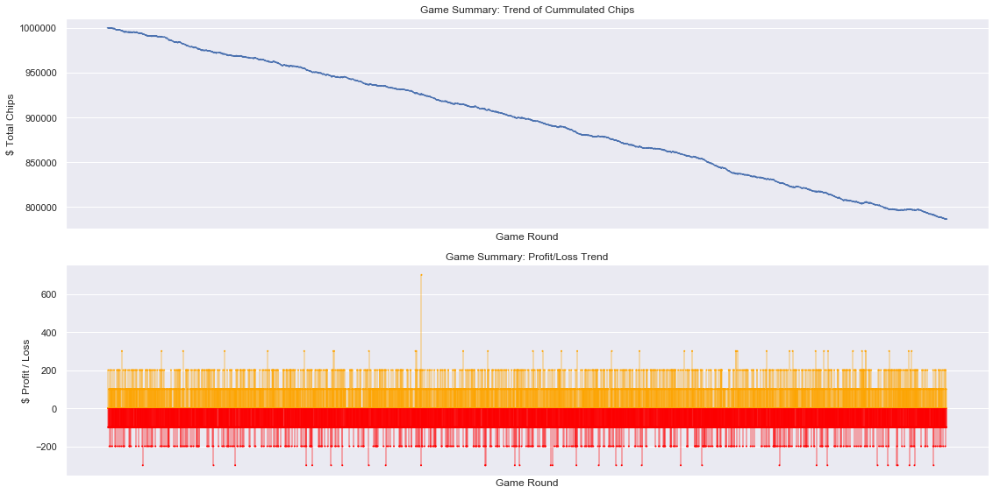

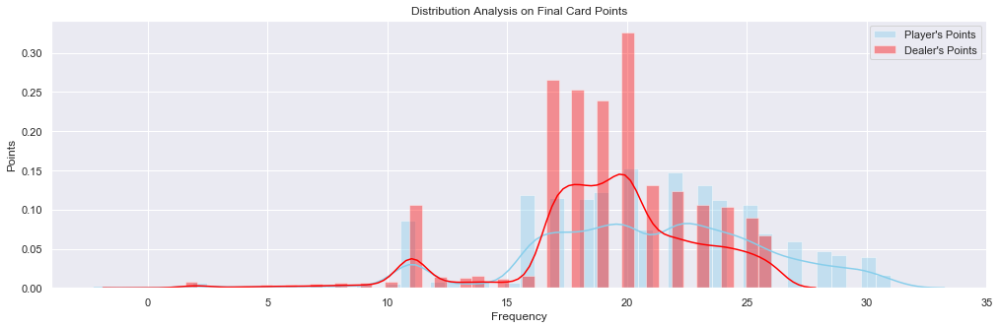

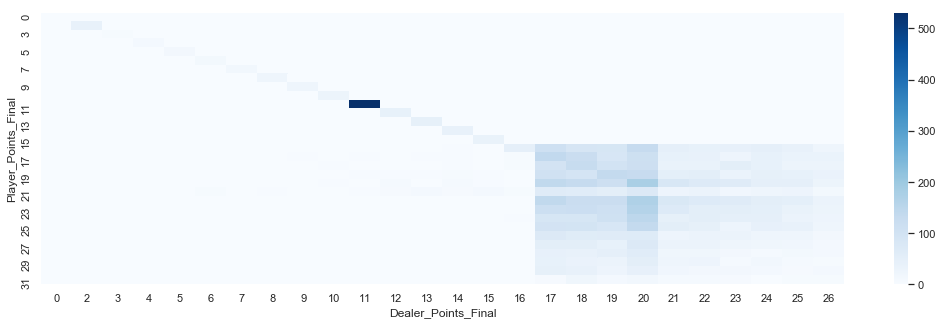

In [49]:
df = game_summary(total_chips = total_chips, LnP = LnP, bid_lst = bid_lst,player_pts_lst=player_pts_lst)

#### Actual Game Environment (Result from Trained Model - $$$ )

In [97]:
player.player_Q_Values

{(11, 1, True): {1: 0, 0: 0},
 (11, 1, False): {1: 0, 0: 0},
 (11, 2, True): {1: 0, 0: 0},
 (11, 2, False): {1: 0, 0: 0},
 (11, 3, True): {1: 0, 0: 0},
 (11, 3, False): {1: 0, 0: 0},
 (11, 4, True): {1: 0, 0: 0},
 (11, 4, False): {1: 0, 0: 0},
 (11, 5, True): {1: 0, 0: 0},
 (11, 5, False): {1: 0, 0: 0},
 (11, 6, True): {1: 0, 0: 0},
 (11, 6, False): {1: 0, 0: 0},
 (11, 7, True): {1: 0, 0: 0},
 (11, 7, False): {1: 0, 0: 0},
 (11, 8, True): {1: 0, 0: 0},
 (11, 8, False): {1: 0, 0: 0},
 (11, 9, True): {1: 0, 0: 0},
 (11, 9, False): {1: 0, 0: 0},
 (11, 10, True): {1: 0, 0: 0},
 (11, 10, False): {1: 0, 0: 0},
 (12, 1, True): {1: 0, 0: 0},
 (12, 1, False): {1: -0.528, 0: 0},
 (12, 2, True): {1: 0, 0: 0},
 (12, 2, False): {1: -0.513, 0: 0},
 (12, 3, True): {1: 0, 0: 0},
 (12, 3, False): {1: -0.275, 0: 0},
 (12, 4, True): {1: 0, 0: 0},
 (12, 4, False): {1: -0.478, 0: 0},
 (12, 5, True): {1: 0, 0: 0},
 (12, 5, False): {1: -0.386, 0: 0},
 (12, 6, True): {1: 0, 0: 0},
 (12, 6, False): {1: -0.477,

In [107]:
# run 2-3 epochs on trained model (each game 5000, total approx 15,000 games with lr = 0.1 and exp_rate = 0)
# you should see winning % plateau off and STAYS PROFITABLE ALL THE TIME

In [50]:
vers = 2.00
player = Blackjack()
player.build_deck()
actual_deck = player.full_deck.copy()
player.reset()
player.lr = 0.1
player.exp_rate = 0

# for Data collection
total_chips = [1000000] #starting
bid_lst = [0]
LnP = [0]
player_pts_lst = [0]
deal_pts_lst = [0]

print(f"$$$ You have starting cash of ${total_chips[-1]}")

for i in range(0,5000):
    player.reset()
    random.shuffle(full_deck)
    actual_deck = full_deck.copy()    
    
    # Bidding input verification
    #bid = input("How much do you want to bid? : ")
    bid = "100"
    while sum([ 1 for j in bid if j not in "0123456789"])>0:
        print("Please enter valid integer.")
        bid = input("How much do you want to bid? : ")
        continue
    bid = eval(bid)
    while bid > total_chips[-1]:
        print("You have no money...")
        bid = input("How much do you want to bid? : ")
        bid = eval(bid)
        continue
    bid_lst.append(bid)
    
    print("\n")
    print(f"************************** Round {i+1} **************************")
    print(f"$$$ You have bidded ${bid}!")
    print(f"$$$ You have remaining ${total_chips[-1] - bid_lst[-1]}!")
    print("\n")
    print(colored("--- Player's Turn ---", 'blue'))
    player_hand = draw_hand(actual_deck)
    dealer_hand = draw_hand(actual_deck)
    play_pts = calculate_pts(player_hand)
    deal_pts = calculate_pts(dealer_hand)
    print(f"You got: {player_hand}")
    
    player.state = max(play_pts), dealer_hand[0] if type(dealer_hand[0]) == int else min(calculate_pts(dealer_hand[0])),True if len(play_pts)>1 else False
    
    # Check for Natural Win
    player.natural_win_player(player_deck = player_hand)
    player.natural_win_dealer(dealer_deck = dealer_hand)
    if player.end_game == True:
        pay = player.natural_winner(bid)
        total_chips.append(total_chips[-1]+pay)
        LnP.append(pay)
        player_pts_lst.append(min(play_pts)) # data collection
        deal_pts_lst.append(min(play_pts)) # data collection
        continue
        
    # Continue if no Natural Win
    # ------------------------------- PLAYER TURN ----------------------------------
    if not player.end_game:
        play_pts = calculate_pts(player_hand)
        display_pts(play_pts)   
        
        action = player.chooseAction()
        if max(play_pts)>11:
            player.player_state_action.append([player.state, action])

        while action and min(play_pts)<=21 and not player.end_turn:
            player_hand = draw_card(actual_deck,player_hand)
            play_pts = calculate_pts(player_hand)
            print(f"You got: {player_hand}")
            display_pts(play_pts)
            player.natural_win_player(player_deck = player_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
            if max(play_pts)<=21:
                player.state = max(play_pts), dealer_hand[0] if type(dealer_hand[0]) == int else min(calculate_pts(dealer_hand[0])),True if len(play_pts)>1 else False
                action = player.chooseAction()
        
    # ------------------------------- DEALER TURN ----------------------------------
    if not player.end_game:
        print(colored("--- Dealer's Turn ---", 'red'))      
        while max(deal_pts) < 17 and len(dealer_hand)<5:
            dealer_hand = draw_card(actual_deck,dealer_hand)
            print("Dealer drew a card...")
            deal_pts = calculate_pts(dealer_hand)
            player.natural_win_dealer(dealer_deck = dealer_hand)
            if player.end_game == True:
                pay = player.natural_winner(bid)
                break
        
        play_pts = max(play_pts)
        deal_pts = max(deal_pts)
        print(f"Dealer got : {dealer_hand}")
        print(f"Dealer have total of {deal_pts}.")
        print("\n")
        result = compare(play_pts, deal_pts)
        pay = player.winner(result, bid)
        player.end_game = True
        print("\n")
    
    play_pts = max(calculate_pts(player_hand))
    deal_pts = max(calculate_pts(dealer_hand))
    LnP.append(pay)
    total_chips.append(total_chips[-1]+pay)
    player_pts_lst.append(play_pts) # data collection
    deal_pts_lst.append(deal_pts) # data collection

    if not player.player_natwin or not player.dealer_natwin:
        player._giveCredit(play_pts, deal_pts)
   
    #cont_ = input("Continue to next round? Y/N :")
    cont_ = 'y'
    while cont_.lower() not in "yn":
        print("Invalid input. Please enter Y/N.")
        cont_ = input("Continue to next round? Y/N :")   
    if cont_.lower() == 'y':
        continue
    elif cont_.lower() == 'n':
        print("Game ended.")
        # see result
        break

$$$ You have starting cash of $1000000


************************** Round 1 **************************
$$$ You have bidded $100!
$$$ You have remaining $999900!


--- Player's Turn ---
You got: [2, 3]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 2 **************************
$$$ You have bidded $100!
$$$ You have remaining $999700!


--- Player's Turn ---
You got: [6, 10]
You have total of 16.
greedy action 1
You got: [6, 10, 6]
You have total of 22.
--- Dealer's Turn ---
Dealer got : ['Q', 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 3 **************************
$$$ You have bidded $100!
$$$ You have remaining $999600!


--- Player's Turn ---
You got: [5, 7]
You have total of 12.
You got: [5, 7, 8]
You have total of 20.
greedy action 1
You got: [5, 7, 8, 5]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 2, 8]
Dealer have total of 17.


YOU LOST! $-100 to yo



YOU LOST! $-100 to your stash.




************************** Round 87 **************************
$$$ You have bidded $100!
$$$ You have remaining $996500!


--- Player's Turn ---
You got: [7, 9]
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['J', 8]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 88 **************************
$$$ You have bidded $100!
$$$ You have remaining $996400!


--- Player's Turn ---
You got: [5, 'J']
You have total of 15.
You got: [5, 'J', 3]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['Q', 9]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 89 **************************
$$$ You have bidded $100!
$$$ You have remaining $996300!


--- Player's Turn ---
You got: ['A', 10]
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 90 **************************


greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 8]
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 161 **************************
$$$ You have bidded $100!
$$$ You have remaining $995400!


--- Player's Turn ---
You got: [6, 6]
You have total of 12.
You got: [6, 6, 'J']
You have total of 22.
--- Dealer's Turn ---
Dealer got : [10, 10]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 162 **************************
$$$ You have bidded $100!
$$$ You have remaining $995300!


--- Player's Turn ---
You got: [9, 9]
You have total of 18.
greedy action 1
You got: [9, 9, 2]
You have total of 20.
greedy action 1
You got: [9, 9, 2, 8]
You have total of 28.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 5, 4, 4, 8]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 163 **************************
$$$ 



************************** Round 237 **************************
$$$ You have bidded $100!
$$$ You have remaining $994900!


--- Player's Turn ---
You got: [9, 5]
You have total of 14.
You got: [9, 5, 'Q']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [7, 6, 3, 4]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 238 **************************
$$$ You have bidded $100!
$$$ You have remaining $994800!


--- Player's Turn ---
You got: ['Q', 3]
You have total of 13.
You got: ['Q', 3, 'J']
You have total of 23.
--- Dealer's Turn ---
Dealer got : [9, 'K']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 239 **************************
$$$ You have bidded $100!
$$$ You have remaining $994700!


--- Player's Turn ---
You got: ['K', 10]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q'



YOU LOST! $-100 to your stash.




************************** Round 322 **************************
$$$ You have bidded $100!
$$$ You have remaining $996600!


--- Player's Turn ---
You got: [6, 5]
You have total of 11.
You got: [6, 5, 'Q']
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 3, 8, 'K']
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 323 **************************
$$$ You have bidded $100!
$$$ You have remaining $996700!


--- Player's Turn ---
You got: ['J', 3]
You have total of 13.
You got: ['J', 3, 'Q']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'J', 'A']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 324 **************************
$$$ You have bidded $100!
$$$ You have remaining $996600!


--- Player's Turn ---
You got: [2, 2]
You have total of 4.
You

--- Dealer's Turn ---
Dealer got : [10, 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 422 **************************
$$$ You have bidded $100!
$$$ You have remaining $999500!


--- Player's Turn ---
You got: [4, 9]
You have total of 13.
You got: [4, 9, 10]
You have total of 23.
--- Dealer's Turn ---
Dealer got : ['J', 'K']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 423 **************************
$$$ You have bidded $100!
$$$ You have remaining $999400!


--- Player's Turn ---
You got: ['Q', 8]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 'J', 3]
Dealer have total of 18.


IT IS A DRAW!




************************** Round 424 **************************
$$$ You have bidded $100!
$$$ You have remaining $999400!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's T

You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 5, 'Q']
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 501 **************************
$$$ You have bidded $100!
$$$ You have remaining $1000100!


--- Player's Turn ---
You got: [7, 9]
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 'K', 10]
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 502 **************************
$$$ You have bidded $100!
$$$ You have remaining $1000200!


--- Player's Turn ---
You got: [3, 9]
You have total of 12.
You got: [3, 9, 'K']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 7, 9]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 503 **************************
$$$ You have bidded $100!
$$$ You have remaining $1000200!


--- P

--- Player's Turn ---
You got: [9, 'Q']
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['J', 'J']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 600 **************************
$$$ You have bidded $100!
$$$ You have remaining $997700!


--- Player's Turn ---
You got: [6, 5]
You have total of 11.
You got: [6, 5, 10]
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [6, 'A']
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 601 **************************
$$$ You have bidded $100!
$$$ You have remaining $997800!


--- Player's Turn ---
You got: ['A', 'J']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 602 **************************
$$$ You have bidded $100!
$$$ You have remaining $998000!


--- Player's Turn ---
You got: ['K', 6]
You have total of 16.
greedy action 1
You got: ['K', 6, '


YOU WON! $100 to your stash.




************************** Round 688 **************************
$$$ You have bidded $100!
$$$ You have remaining $999200!


--- Player's Turn ---
You got: [5, 9]
You have total of 14.
You got: [5, 9, 3]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 7, 'Q']
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 689 **************************
$$$ You have bidded $100!
$$$ You have remaining $999300!


--- Player's Turn ---
You got: [9, 10]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['K', 5, 'A', 10]
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 690 **************************
$$$ You have bidded $100!
$$$ You have remaining $999400!


--- Player's Turn ---
You got: ['Q', 5]
You have total of 15.
You got: ['Q', 5, 6]



--- Player's Turn ---
You got: ['A', 5]
You have total of 6 or 16.
greedy action 1
You got: ['A', 5, 'K']
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 9, 'J']
Dealer have total of 24.


YOU WON! $100 to your stash.




************************** Round 796 **************************
$$$ You have bidded $100!
$$$ You have remaining $997800!


--- Player's Turn ---
You got: [7, 'A']
You have total of 8 or 18.
greedy action 1
You got: [7, 'A', 2]
You have total of 10 or 20.
greedy action 1
You got: [7, 'A', 2, 5]
You have total of 15.
You got: [7, 'A', 2, 5, 8]
You have total of 23.
--- Dealer's Turn ---
Dealer got : [7, 'Q']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 797 **************************
$$$ You have bidded $100!
$$$ You have remaining $997700!


--- Player's Turn ---
You got: [6, 3]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


********************

greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [7, 'J']
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 903 **************************
$$$ You have bidded $100!
$$$ You have remaining $997700!


--- Player's Turn ---
You got: [8, 3]
You have total of 11.
You got: [8, 3, 4]
You have total of 15.
You got: [8, 3, 4, 'Q']
You have total of 25.
--- Dealer's Turn ---
Dealer got : [10, 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 904 **************************
$$$ You have bidded $100!
$$$ You have remaining $997600!


--- Player's Turn ---
You got: [4, 4]
You have total of 8.
You got: [4, 4, 2]
You have total of 10.
You got: [4, 4, 2, 'J']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['J', 9]
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 905 **************************
$$$ You have bid

greedy action 0
--- Dealer's Turn ---
Dealer got : [7, 'K']
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 1006 **************************
$$$ You have bidded $100!
$$$ You have remaining $997500!


--- Player's Turn ---
You got: ['A', 8]
You have total of 9 or 19.
greedy action 1
You got: ['A', 8, 4]
You have total of 13.
You got: ['A', 8, 4, 'Q']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 'K', 3, 5]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 1007 **************************
$$$ You have bidded $100!
$$$ You have remaining $997400!


--- Player's Turn ---
You got: [7, 9]
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [10, 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 1008 **************************
$$$ You have bidded $100!
$$$ You have

$$$ You have remaining $997800!


--- Player's Turn ---
You got: [6, 8]
You have total of 14.
You got: [6, 8, 7]
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 'K', 4]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 1079 **************************
$$$ You have bidded $100!
$$$ You have remaining $997900!


--- Player's Turn ---
You got: [4, 'K']
You have total of 14.
You got: [4, 'K', 8]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 5, 'K']
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 1080 **************************
$$$ You have bidded $100!
$$$ You have remaining $997800!


--- Player's Turn ---
You got: [9, 2]
You have total of 11.
You got: [9, 2, 'A']
You have total of 12.
You got: [9, 2, 'A', 5]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a c





************************** Round 1172 **************************
$$$ You have bidded $100!
$$$ You have remaining $996700!


--- Player's Turn ---
You got: [5, 5]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 1173 **************************
$$$ You have bidded $100!
$$$ You have remaining $996500!


--- Player's Turn ---
You got: [6, 10]
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 8]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 1174 **************************
$$$ You have bidded $100!
$$$ You have remaining $996400!


--- Player's Turn ---
You got: [3, 'A']
You have total of 4 or 14.
You got: [3, 'A', 9]
You have total of 13.
You got: [3, 'A', 9, 5]
You have total of 18.
greedy action 1
You got: [3, 'A', 9, 5, 10]
You have total of 28.
--- Dealer's Turn ---
Dealer got : [9, 'Q']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




**

You got: ['Q', 9]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [10, 9]
Dealer have total of 19.


IT IS A DRAW!




************************** Round 1278 **************************
$$$ You have bidded $100!
$$$ You have remaining $995600!


--- Player's Turn ---
You got: [6, 'K']
You have total of 16.
greedy action 1
You got: [6, 'K', 2]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['A', 2, 5]
Dealer have total of 18.


IT IS A DRAW!




************************** Round 1279 **************************
$$$ You have bidded $100!
$$$ You have remaining $995600!


--- Player's Turn ---
You got: [10, 7]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 5, 'Q']
Dealer have total of 17.


IT IS A DRAW!




************************** Round 1280 **************************
$$$ You have bidded $100!
$$$ You have remaining $9



YOU WON! $100 to your stash.




************************** Round 1383 **************************
$$$ You have bidded $100!
$$$ You have remaining $996900!


--- Player's Turn ---
You got: [3, 7]
You have total of 10.
You got: [3, 7, 4]
You have total of 14.
You got: [3, 7, 4, 8]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [5, 7, 3, 6]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 1384 **************************
$$$ You have bidded $100!
$$$ You have remaining $996800!


--- Player's Turn ---
You got: ['Q', 10]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 8, 'A']
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 1385 **************************
$$$ You have bidded $100!
$$$ You have remaining $996700!


--- Player's Turn ---
You got: ['K', 4]
Dealer got Ban Luck!
YOU 

$$$ You have remaining $996900!


--- Player's Turn ---
You got: [9, 3]
You have total of 12.
You got: [9, 3, 'A']
You have total of 13.
You got: [9, 3, 'A', 7]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [3, 8, 2, 10]
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 1488 **************************
$$$ You have bidded $100!
$$$ You have remaining $997000!


--- Player's Turn ---
You got: [8, 'J']
You have total of 18.
greedy action 1
You got: [8, 'J', 3]
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 6, 'K']
Dealer have total of 26.


YOU WON! $100 to your stash.




************************** Round 1489 **************************
$$$ You have bidded $100!
$$$ You have remaining $997100!


--- Player's Turn ---
You got: [9, 'Q']
You have total of 19.
greedy action 1
greedy action 0
--- 

Dealer got : [9, 10]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 1574 **************************
$$$ You have bidded $100!
$$$ You have remaining $997600!


--- Player's Turn ---
You got: ['Q', 3]
You have total of 13.
You got: ['Q', 3, 'J']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 10, 4]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 1575 **************************
$$$ You have bidded $100!
$$$ You have remaining $997500!


--- Player's Turn ---
You got: ['Q', 4]
You have total of 14.
You got: ['Q', 4, 5]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 5, 5, 2, 10]
Dealer have total of 24.


YOU WON! $100 to your stash.




************************** Round 1576 **************************
$$$ You have bidded $100!
$$$ You have remaining $

--- Player's Turn ---
You got: [3, 4]
You have total of 7.
You got: [3, 4, 7]
You have total of 14.
You got: [3, 4, 7, 6]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [8, 10]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 1680 **************************
$$$ You have bidded $100!
$$$ You have remaining $997400!


--- Player's Turn ---
You got: [8, 'A']
You have total of 9 or 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 5, 7]
Dealer have total of 19.


IT IS A DRAW!




************************** Round 1681 **************************
$$$ You have bidded $100!
$$$ You have remaining $997400!


--- Player's Turn ---
You got: [10, 'Q']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 6]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 1682 ***********************

You got: ['A', 10]
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 1789 **************************
$$$ You have bidded $100!
$$$ You have remaining $997500!


--- Player's Turn ---
You got: [8, 4]
You have total of 12.
You got: [8, 4, 'K']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 9, 10]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 1790 **************************
$$$ You have bidded $100!
$$$ You have remaining $997500!


--- Player's Turn ---
You got: [10, 4]
You have total of 14.
You got: [10, 4, 6]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 5, 5]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 1791 **************************
$$$ You have bidded $100!
$$$ You have remaining $997600!


--- Player's Turn ---
You got: ['A', 'K']
You got Ban Luck!
YOU WON! $200 to yo


--- Player's Turn ---
You got: ['K', 9]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 4, 5]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 1896 **************************
$$$ You have bidded $100!
$$$ You have remaining $998000!


--- Player's Turn ---
You got: [6, 4]
You have total of 10.
You got: [6, 4, 5]
You have total of 15.
You got: [6, 4, 5, 10]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 10, 8]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 1897 **************************
$$$ You have bidded $100!
$$$ You have remaining $998000!


--- Player's Turn ---
You got: [9, 5]
You have total of 14.
You got: [9, 5, 3]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 10, 3]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




******

You got: [10, 'J']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['K', 'Q']
Dealer have total of 20.


IT IS A DRAW!




************************** Round 2005 **************************
$$$ You have bidded $100!
$$$ You have remaining $998300!


--- Player's Turn ---
You got: [2, 8]
You have total of 10.
You got: [2, 8, 4]
You have total of 14.
You got: [2, 8, 4, 4]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [8, 'A']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2006 **************************
$$$ You have bidded $100!
$$$ You have remaining $998200!


--- Player's Turn ---
You got: [3, 'J']
You have total of 13.
You got: [3, 'J', 5]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 8]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2007 **********************


--- Player's Turn ---
You got: [2, 'K']
You have total of 12.
You got: [2, 'K', 'K']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 2, 3, 6]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 2111 **************************
$$$ You have bidded $100!
$$$ You have remaining $998200!


--- Player's Turn ---
You got: [2, 3]
You have total of 5.
You got: [2, 3, 5]
You have total of 10.
You got: [2, 3, 5, 5]
You have total of 15.
You got: [2, 3, 5, 5, 6]
You have total of 21.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 2112 **************************
$$$ You have bidded $100!
$$$ You have remaining $998400!


--- Player's Turn ---
You got: [5, 3]
You have total of 8.
You got: [5, 3, 'Q']
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 'J', 9]
Dealer have total of 23.


YOU WON! $100 to you

--- Player's Turn ---
You got: ['A', 3]
You have total of 4 or 14.
You got: ['A', 3, 'A']
You have total of 5 or 15.
You got: ['A', 3, 'A', 6]
You have total of 11.
You got: ['A', 3, 'A', 6, 5]
You have total of 16.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 2219 **************************
$$$ You have bidded $100!
$$$ You have remaining $1000800!


--- Player's Turn ---
You got: [2, 6]
You have total of 8.
You got: [2, 6, 7]
You have total of 15.
You got: [2, 6, 7, 2]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['K', 'Q']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 2220 **************************
$$$ You have bidded $100!
$$$ You have remaining $1000700!


--- Player's Turn ---
You got: [4, 7]
You have total of 11.
You got: [4, 7, 8]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 6, 'A']

You have total of 9.
You got: [4, 5, 2]
You have total of 11.
You got: [4, 5, 2, 3]
You have total of 14.
You got: [4, 5, 2, 3, 7]
You have total of 21.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 2324 **************************
$$$ You have bidded $100!
$$$ You have remaining $1002100!


--- Player's Turn ---
You got: [2, 10]
You have total of 12.
You got: [2, 10, 2]
You have total of 14.
You got: [2, 10, 2, 8]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['A', 2, 'J', 5]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 2325 **************************
$$$ You have bidded $100!
$$$ You have remaining $1002000!


--- Player's Turn ---
You got: [5, 5]
You have total of 10.
You got: [5, 5, 'J']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 6, 9]
Dealer have total of 24.


YOU WON! $100

greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 4, 'Q']
Dealer have total of 20.


YOU WON! $100 to your stash.




************************** Round 2428 **************************
$$$ You have bidded $100!
$$$ You have remaining $1002300!


--- Player's Turn ---
You got: ['Q', 5]
You have total of 15.
You got: ['Q', 5, 4]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got : [6, 2, 7, 'A', 6]
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 2429 **************************
$$$ You have bidded $100!
$$$ You have remaining $1002400!


--- Player's Turn ---
You got: [8, 9]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 6, 'J']
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 2430 ************

You have total of 10.
You got: [6, 4, 6]
You have total of 16.
greedy action 1
You got: [6, 4, 6, 5]
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [9, 10]
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 2533 **************************
$$$ You have bidded $100!
$$$ You have remaining $1003100!


--- Player's Turn ---
You got: [2, 3]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 2534 **************************
$$$ You have bidded $100!
$$$ You have remaining $1002900!


--- Player's Turn ---
You got: [7, 2]
You have total of 9.
You got: [7, 2, 'K']
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [9, 'J']
Dealer have total of 19.


IT IS A DRAW!




************************** Round 2535 **************************
$$$ You have bidded $100!
$$$ You have remaining $1002900!


--- Player's Turn ---
You got: [10, 'K']
You have



--- Player's Turn ---
You got: [5, 'K']
You have total of 15.
You got: [5, 'K', 'A']
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [9, 9]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 2641 **************************
$$$ You have bidded $100!
$$$ You have remaining $1005200!


--- Player's Turn ---
You got: [9, 'A']
You have total of 10 or 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['Q', 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 2642 **************************
$$$ You have bidded $100!
$$$ You have remaining $1005300!


--- Player's Turn ---
You got: [7, 7]
You have total of 14.
You got: [7, 7, 9]
You have total of 23.
--- Dealer's Turn ---
Dealer got : [9, 10]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 2643 **************************
$$$ You have bidded $100!
$$

Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 2743 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006600!


--- Player's Turn ---
You got: [9, 10]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [10, 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 2744 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006700!


--- Player's Turn ---
You got: [6, 5]
You have total of 11.
You got: [6, 5, 'Q']
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [9, 4, 'J']
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 2745 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006800!


--- Player's Turn ---
You got: [8, 7]
You have total of 15.
You got: [8, 7, 10]
You have total of 25

--- Dealer's Turn ---
Dealer got : [7, 'K']
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 2822 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006300!


--- Player's Turn ---
You got: ['A', 10]
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 2823 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006500!


--- Player's Turn ---
You got: ['J', 'J']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [8, 'A']
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 2824 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006600!


--- Player's Turn ---
You got: [3, 3]
You have total of 6.
You got: [3, 3, 10]
You have total of 16.
greedy action 1
You got: [3, 3, 10, 6]
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['J', 4, 


YOU LOST! $-100 to your stash.




************************** Round 2929 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006400!


--- Player's Turn ---
You got: [6, 7]
You have total of 13.
You got: [6, 7, 3]
You have total of 16.
greedy action 1
You got: [6, 7, 3, 4]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 8]
Dealer have total of 19.


YOU WON! $100 to your stash.




************************** Round 2930 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006500!


--- Player's Turn ---
You got: ['J', 3]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 2931 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006300!


--- Player's Turn ---
You got: [4, 'K']
You have total of 14.
You got: [4, 'K', 'Q']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...


$$$ You have bidded $100!
$$$ You have remaining $1007300!


--- Player's Turn ---
You got: [3, 3]
You have total of 6.
You got: [3, 3, 6]
You have total of 12.
You got: [3, 3, 6, 5]
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 9, 'Q']
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 3037 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007400!


--- Player's Turn ---
You got: [10, 'K']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 5, 5]
Dealer have total of 20.


IT IS A DRAW!




************************** Round 3038 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007400!


--- Player's Turn ---
You got: ['A', 9]
You have total of 10 or 20.
greedy action 1
You got: ['A', 9, 6]
You have total of 16.
greedy action 1
You got: ['A', 9, 6, 3]
You ha

You have total of 9.
You got: [5, 4, 'Q']
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [4, 5, 5, 9]
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 3144 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007400!


--- Player's Turn ---
You got: [4, 4]
You have total of 8.
You got: [4, 4, 2]
You have total of 10.
You got: [4, 4, 2, 'Q']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['Q', 'K']
Dealer have total of 20.


IT IS A DRAW!




************************** Round 3145 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007400!


--- Player's Turn ---
You got: ['K', 'J']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [10, 5, 'J']
Dealer have total of 25.


YOU WON! $100 to your stash.




*****

greedy action 1
You got: [6, 10, 9]
You have total of 25.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 9, 9]
Dealer have total of 25.


IT IS A DRAW!




************************** Round 3253 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006500!


--- Player's Turn ---
You got: [3, 8]
You have total of 11.
You got: [3, 8, 'J']
You have total of 21.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 9]
Dealer have total of 20.


YOU WON! $100 to your stash.




************************** Round 3254 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006600!


--- Player's Turn ---
You got: [3, 10]
You have total of 13.
You got: [3, 10, 7]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['J', 8]
Dealer have total of 18.


YOU WON! $100 to your stash.




************************** Round 3255 **************************
$$$ You have bidded $100!
$$$ You h

$$$ You have remaining $1006300!


--- Player's Turn ---
You got: ['A', 9]
You have total of 10 or 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['Q', 7]
Dealer have total of 17.


YOU WON! $100 to your stash.




************************** Round 3362 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006400!


--- Player's Turn ---
You got: [5, 'J']
You have total of 15.
You got: [5, 'J', 4]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 7, 8]
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 3363 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006300!


--- Player's Turn ---
You got: ['K', 9]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [8, 6, 4]
Dealer have total of 18.


YOU WON! $100 to your stash.




**********************

YOU LOST! $-100 to your stash.




************************** Round 3466 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [3, 3]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 3467 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007500!


--- Player's Turn ---
You got: [4, 'Q']
You have total of 14.
You got: [4, 'Q', 10]
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [3, 5, 6, 9]
Dealer have total of 23.


IT IS A DRAW!




************************** Round 3468 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007500!


--- Player's Turn ---
You got: [5, 7]
You have total of 12.
You got: [5, 7, 8]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 10, 'J']
Dealer have total of 25.


YOU WON! $100 to your 

$$$ You have remaining $1007200!


--- Player's Turn ---
You got: [3, 9]
You have total of 12.
You got: [3, 9, 'A']
You have total of 13.
You got: [3, 9, 'A', 'J']
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 'Q', 2]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 3575 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007100!


--- Player's Turn ---
You got: [3, 9]
You have total of 12.
You got: [3, 9, 'J']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : ['Q', 6, 6]
Dealer have total of 22.


IT IS A DRAW!




************************** Round 3576 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007100!


--- Player's Turn ---
You got: [9, 'Q']
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [2, 6, 2, 'Q']
Dealer have total of 20.





YOU WON! $100 to your stash.




************************** Round 3684 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007300!


--- Player's Turn ---
You got: [8, 6]
You have total of 14.
You got: [8, 6, 6]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 8, 10]
Dealer have total of 20.


IT IS A DRAW!




************************** Round 3685 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007300!


--- Player's Turn ---
You got: [6, 'Q']
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 3, 9]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 3686 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007200!


--- Player's Turn ---
You got: [4, 3]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


**************************

You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 3794 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---
You got: [10, 9]
You have total of 19.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : [9, 'Q']
Dealer have total of 19.


IT IS A DRAW!




************************** Round 3795 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---
You got: ['J', 4]
You have total of 14.
You got: ['J', 4, 9]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [10, 5, 'A', 8]
Dealer have total of 24.


IT IS A DRAW!




************************** Round 3796 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---
You got: [3, 'K']
You have total of 13.
You got: [3, 'K', 8]
You have total of 21.
greedy action 1
greedy action 0
--- Deale

--- Dealer's Turn ---
Dealer got : [8, 'A']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 3903 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [7, 5]
You have total of 12.
You got: [7, 5, 6]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [7, 6, 'K']
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 3904 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---
You got: [8, 8]
You have total of 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [2, 10, 7]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 3905 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [


--- Player's Turn ---
You got: [9, 3]
You have total of 12.
You got: [9, 3, 2]
You have total of 14.
You got: [9, 3, 2, 'J']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [3, 6, 10]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 4008 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008600!


--- Player's Turn ---
You got: [6, 'Q']
You have total of 16.
greedy action 1
You got: [6, 'Q', 'J']
You have total of 26.
--- Dealer's Turn ---
Dealer got : ['K', 7]
Dealer have total of 17.


YOU LOST! $-100 to your stash.




************************** Round 4009 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008500!


--- Player's Turn ---
You got: ['Q', 10]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 4010 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008300!


--- Player's Turn --

$$$ You have remaining $1007100!


--- Player's Turn ---
You got: ['J', 10]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 10, 9]
Dealer have total of 25.


YOU WON! $100 to your stash.




************************** Round 4114 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007200!


--- Player's Turn ---
You got: [10, 5]
You have total of 15.
You got: [10, 5, 8]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : [7, 2, 4, 5]
Dealer have total of 18.


YOU LOST! $-100 to your stash.




************************** Round 4115 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007100!


--- Player's Turn ---
You got: [4, 8]
You have total of 12.
You got: [4, 8, 2]
You have total of 14.
You got: [4, 8, 2, 'Q']
You have total of 24.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 8, 'Q']
Dealer have total

$$$ You have remaining $1006700!


--- Player's Turn ---
You got: [6, 5]
Dealer got Ban Ban!
YOU LOST! $-300 to your stash.


************************** Round 4222 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006400!


--- Player's Turn ---
You got: [5, 2]
Dealer got Ban Ban!
YOU LOST! $-300 to your stash.


************************** Round 4223 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006100!


--- Player's Turn ---
You got: [2, 2]
You have total of 4.
You got: [2, 2, 5]
You have total of 9.
You got: [2, 2, 5, 3]
You have total of 12.
You got: [2, 2, 5, 3, 6]
You have total of 18.
You got Dragon!
YOU WON! $200 to your stash.


************************** Round 4224 **************************
$$$ You have bidded $100!
$$$ You have remaining $1006300!


--- Player's Turn ---
You got: [8, 'Q']
You have total of 18.
greedy action 1
You got: [8, 'Q', 5]
You have total of 23.
--- Dealer's Turn ---
Dealer drew a card...
Dea

YOU WON! $100 to your stash.




************************** Round 4330 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [3, 10]
You have total of 13.
You got: [3, 10, 'Q']
You have total of 23.
--- Dealer's Turn ---
Dealer got : [10, 'J']
Dealer have total of 20.


YOU LOST! $-100 to your stash.




************************** Round 4331 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007600!


--- Player's Turn ---
You got: [6, 3]
You have total of 9.
You got: [6, 3, 6]
You have total of 15.
You got: [6, 3, 6, 3]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 3, 'A']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 4332 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007500!


--- Player's Turn ---
You got: [8, 3]
You have total of 11.
You got: [

greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU LOST! $-200 to your stash.
Dealer got : [6, 6, 2, 'A', 5]
Dealer have total of 20.


YOU WON! $100 to your stash.




************************** Round 4438 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007500!


--- Player's Turn ---
You got: [6, 'J']
You have total of 16.
greedy action 1
You got: [6, 'J', 'A']
You have total of 17.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 9, 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 4439 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007400!


--- Player's Turn ---
You got: [7, 10]
You have total of 17.
greedy action 1
You got: [7, 10, 6]
You have total of 23.
--- Dealer's Turn ---
Dealer got : [7, 'Q']
Dealer have total of 17.


YOU LOST! $-1



************************** Round 4542 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [8, 'K']
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 8, 'J']
Dealer have total of 24.


YOU WON! $100 to your stash.




************************** Round 4543 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---
You got: [2, 'K']
You have total of 12.
You got: [2, 'K', 4]
You have total of 16.
greedy action 1
You got: [2, 'K', 4, 10]
You have total of 26.
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 10, 7]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 4544 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [6, 5]
You have total of 11.
You got: [6, 5, 2]
You have total of 13

--- Dealer's Turn ---
Dealer got : ['A', 8]
Dealer have total of 19.


IT IS A DRAW!




************************** Round 4646 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008600!


--- Player's Turn ---
You got: ['J', 'A']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 4647 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008800!


--- Player's Turn ---
You got: [10, 5]
You have total of 15.
You got: [10, 5, 3]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [6, 3, 10]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 4648 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008700!


--- Player's Turn ---
You got: ['A', 'Q']
You got Ban Luck!
YOU WON! $200 to your stash.


************************** Round 4649 **************************
$$$ You have bidded $

--- Player's Turn ---
You got: [4, 9]
Dealer got Ban Luck!
YOU LOST! $-200 to your stash.


************************** Round 4751 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007600!


--- Player's Turn ---
You got: ['J', 'J']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 10, 7]
Dealer have total of 22.


YOU WON! $100 to your stash.




************************** Round 4752 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [3, 3]
You have total of 6.
You got: [3, 3, 8]
You have total of 14.
You got: [3, 3, 8, 6]
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer got : ['A', 9]
Dealer have total of 20.


IT IS A DRAW!




************************** Round 4753 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: ['A', 'Q']

You got: [4, 5, 7, 6]
You have total of 22.
--- Dealer's Turn ---
Dealer got : [9, 'K']
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 4858 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---
You got: ['Q', 8]
You have total of 18.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [5, 9, 5]
Dealer have total of 19.


YOU LOST! $-100 to your stash.




************************** Round 4859 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007700!


--- Player's Turn ---
You got: [5, 'A']
You have total of 6 or 16.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer got : [4, 9, 'J']
Dealer have total of 23.


YOU WON! $100 to your stash.




************************** Round 4860 **************************
$$$ You have bidded $100!
$$$ You have remaining $1007800!


--- Player's Turn ---



--- Player's Turn ---
You got: ['A', 6]
You have total of 7 or 17.
greedy action 1
You got: ['A', 6, 5]
You have total of 12.
You got: ['A', 6, 5, 'K']
You have total of 22.
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer drew a card...
Dealer got Dragon!
YOU LOST! $-200 to your stash.
Dealer got : [4, 4, 4, 3, 6]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 4961 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008900!


--- Player's Turn ---
You got: [10, 'Q']
You have total of 20.
greedy action 1
greedy action 0
--- Dealer's Turn ---
Dealer drew a card...
Dealer drew a card...
Dealer got : ['A', 2, 'Q', 8]
Dealer have total of 21.


YOU LOST! $-100 to your stash.




************************** Round 4962 **************************
$$$ You have bidded $100!
$$$ You have remaining $1008800!


--- Player's Turn ---
You got: ['A', 'Q']
You got Ban Luck!
YOU WON! $200 to your stash.



In [59]:
# Epoch 1/2/3:

   ======================= GAME SUMMARY =======================


   Number of games       : 5000        Winning Probability: 41.28 %
   Number of games WON   : 2064         Initial Chips      : $ 1000000
   Number of games LOST  : 2099         Final Chips        : $ 1009700
   Number of games DRAW  : 837         Total Earning/Loss : $ 9700
   Number of Natural WIN : 685


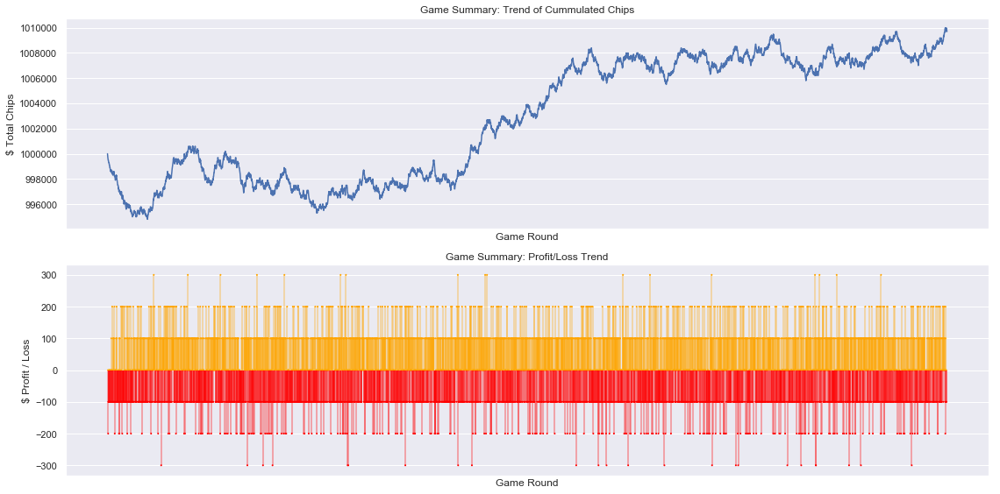

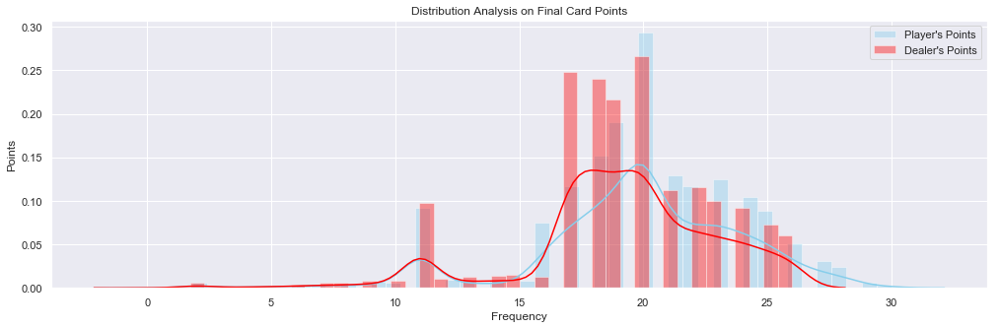

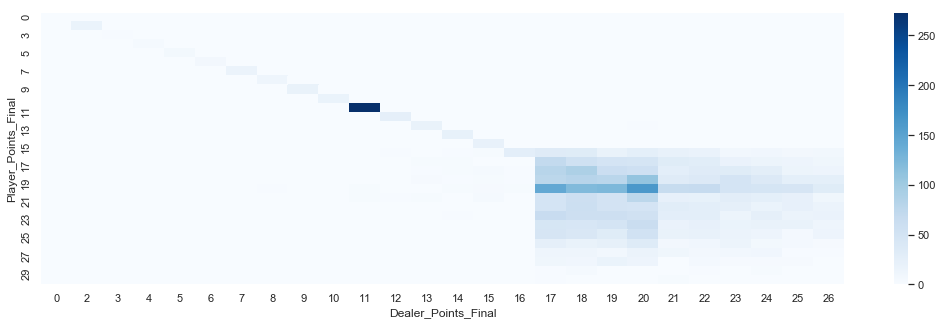

In [51]:
df = game_summary(total_chips = total_chips, LnP = LnP, bid_lst = bid_lst,player_pts_lst=player_pts_lst)